In [1]:
%%html
<style>
table {align:left;display:block}
</style>

# Antarctic subglacial topography map: Figures

This notebook contains code to plot the figures included in the manuscript: 
'Antarctic subglacial topography mapped from space reveals complex mesoscale landscape dynamics'

### Required datasets

The datasets which accompany this notebook can be found at: DOI: 10.5281/zenodo.11127559

**Metrics calculated for each of the 4269 50 km by 50 km regions**

| Filename  (IFPA)|Filename (Bedmachine)    | Description |
| :----------- | :-------------| :----------- |
| x_ifpa.nc     || X Coordinates        |
| y_ifpa.nc   || Y Coordinates         |
| mean_ifpa.nc or ifpa_mean.nc | bedmach_mean.nc | Mean elevation (m) |
| ifpa_count.nc | bedmach_count.nc| The number of hills with a 50 m prominence within a 5 km neighbourhood |
| ifpa_count_max_20.nc | bedmach_count_max_20.nc| The number of hills with a 20 m prominence within a 5 km neighbourhood |
| ifpa_count_max_100.nc | bedmach_count_max_100.nc| The number of hills with a 100 m prominence within a 5 km neighbourhood |
| ifpa_count_max_250.nc | bedmach_count_max_250.nc| The number of hills with a 250 m prominence within a 5 km neighbourhood |
| ifpa_b1_5km.nc | bedmach_b1_5km.nc | The fourier fractal dimension for wavelengths greater than 5 km |
| ifpa_b1_thickness.nc | bedmach_b1_thickness.nc | The fourier fractal dimension for wavelengths greater than the ice thickness |
|ifpa_std_deslope.nc| bedmach_std_deslope.nc| The standard deviation when the best-fit slope is removed |
|i_std_l.nc|b_std_l.nc | The standard deviation of some long wavelength components of the fourier spectrum |
|ifpa_wav_max_power.nc| bedmach_wav_max_power.nc| The wavelength in the Fourier spectrum with the maximum power |
|ifpa_rms_slope.nc| bedmach_rms_slope.nc | The RMS slope of the bed elevation |
|i_rms_slope_h.nc| b_rms_slope_h.nc| The RMS slope of some short wavelength components of the fourier spectrum | 
|ifpa_rms_curvature.nc| bedmach_rms_curvature.nc| The RMS curvature of the bed elevation |
||source.nc| The mean method used to calculate the bed topography (Bedmachine only)|


| Filename (Bedmap3) | Description |
| :---------------| :-------------|
| mean_nearest.nc | The mean distance from each IFPA grid point to the nearest Bedmap3 data point |
| bedmap3_count.nc | The number of Bedmap3 data points within the region |

**Datasets required for plotting**

| Filename      | Description |
| :----------- | :----------- |
| Groundingline_Antarctica_v2.shp     | Antarctic grounding line        |
| ECR_features.shp | Outline of significant features within the example regions chosen | 
| IFPA_bed.nc | IFPA bed topography map for Antarctica |

**External datasets (not provided on Zenodo)**

| Filename      | Description | Reference | DOI |
| :----------- | :----------- | :---------| : --------- |
| GaplessREMA100.nc     | Gapless REMA Antarctica dataset at 100m resolution | Dong et al. (2022)| 10.1016/j.isprsjprs.2022.01.024        |
| BedMachineAntarctica-v3.nc | MEaSURES BedMachine Antarctica bed topography map version 3 | Morlighem et al. (2020) | 10.5067/FPSU0V1MWUB6 |
| antarctica_ice_velocity_450m_v2.nc | ITSLIVE Antarctic velocity map | Gardner et al. (2019) | 10.5067/6II6VW8LLWJ7 |

# Output figures

| Filename      | Description |
| :----------- | :----------- |
| '01_a_Maud Subglacial Basin.png'     | IFPA vs Bedmachine comparison for Maud Subglacial Basin |
| '01_b_Wilhem II Land.png'     | IFPA vs Bedmachine comparison for Wilhelm II Land |
| '01_c_Hercules Dome.png'     | IFPA vs Bedmachine comparison for Hercules Dome |
| '01_d_Recovery Basin.png'     | IFPA vs Bedmachine comparison for Recovery Basin |
| '01_e_Zhigalov Subglacial Mountains.png'     | IFPA vs Bedmachine comparison for Zhigalov Subglacial Mountains |
| '01_f_Terre Adelie.png'     | IFPA vs Bedmachine comparison for Terre Adelie |
| '01_g_Highland A.png'     | IFPA vs Bedmachine comparison for Highland A |
| '01_h_Golicyna Subglacial Mountains.png'     | IFPA vs Bedmachine comparison for Golicyna Subglacial Mountains |
| '01_j_Northern Gamburtsev Subglacial Mountains.png'     | IFPA vs Bedmachine comparison for Northern Gamburtsev Subglacial Mountains |
| '01_k_Locations.png'     | The locations of the 9 comparison regions in Antarctica |
| 02_Metrics.png | The texture of Antarctica’s ice-sheet bed |
|03_Textural_map.png|Geomorphological classification of Antarctica’s subglacial landscape|
| 07_a_Surface_artefacts.png     | IFPA and Bedmachine bed topography, ITSLIVE surface velocity and REMA surface elevation for a region with artefacts from the ice surface elevation|
| 07_b_Velocity_artefacts.png     | IFPA and Bedmachine bed topography, ITSLIVE surface velocity and REMA surface elevation for a region with artefacts from the ice surface velocity|


### Set the filepaths to the input data, and the output folder for figures 

In [2]:
# Set the filepath to all the small datasets 
data_folder = '../Antarctic_subglacial_topo_Data/'
# Set the filepath to all the large datasets 
large_data_folder = '../Data/'

# Set the filepath to where you would like to save the figures
figures_folder = '../Antarctic_subglacial_topo_Figures/'

### Import the required packages and datasets 

In [3]:
# Import the required packages
import numpy as np 
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from shapely.geometry import box
import geopandas as gpd
import earthpy.spatial as es
import glob
import itertools

from inversion_module_v2 import smooth_data_load

In [4]:
# Import the calculated data metrics from folder

filepaths = glob.glob(data_folder +'*.nc')
# Create a matrix to save the data and its filename
data_matrix = np.ndarray((len(filepaths),2), dtype = np.ndarray)
for i in range(len(filepaths)):
    output = Dataset(filepaths[i],'r',format='netCDF4')
    data_matrix[i, 0] = output.variables['data'][:]
    output.close()
    short_filename  = filepaths[i].split('\\')[1].split('.')[0]
    data_matrix[i,1] = short_filename    
    
# Create a function to extract variables based on name 
def extract_from_matrix(variable_name):
    return data_matrix[data_matrix[:,1] == variable_name][0][0].data

C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


In [5]:
# Import the required datasets 

# The mean ifpa elevation of the 4269 50 km by 50 km patches
mean_ifpa = extract_from_matrix('mean_ifpa')
# The x coordinates of the 4269 50 km by 50 km patches 
x_ifpa = extract_from_matrix('X_ifpa')
# The y coordinates of the 4269 50 km by 50 km patches 
y_ifpa = extract_from_matrix('Y_ifpa')
# The number of hills with a 50 m prominence within a 5 km neighbourhood (IFPA)
ifpa_count = extract_from_matrix('ifpa_count')
# The number of hills with a 50 m prominence within a 5 km neighbourhood (Bedmachine)
bedmach_count = extract_from_matrix('bedmach_count')
# The fractal dimension for wavelengths greater than 5 km (IFPA)
ifpa_b1_5km = extract_from_matrix('ifpa_b1_5km')
# The fractal dimension for wavelengths greater than 5 km (Bedmachine)
bedmach_b1_5km = extract_from_matrix('bedmach_b1_5km')

# Shapefile of the Antarctic groundline
groundinglineM = gpd.read_file(data_folder + "GroundingLine_Antarctica_v2.shp")
# Shapefile of significant features in the chosen example regions 
ECR_features = gpd.read_file(data_folder + "ECR_features.shp")

# IFPA Antarctica bed topography map
filepath_ifpa = large_data_folder + "IFPA_bed.nc"

# Gapless REMA Antarctic Ice surface elevation
filepath_rema = large_data_folder + 'GaplessREMA100.nc'
# Bedmachine Antarctica version 3
filepath_bedmach = large_data_folder + 'BedMachineAntarctica-v3.nc'
# ITSLIVE Antarctic ice surface velocities 
filepath_itslive = large_data_folder + 'antarctica_ice_velocity_450m_v2.nc'

### Figure 1

**Selected examples of new subglacial topography derived by IFPA (all panels labelled i) compared with previous interpolated topography (BedMachine) [22] (all panels labelled ii).** All panels are rendered with a hillshade of 315° azimuth and 45° altitude. Note that the panels vary in size from 100 x 100 km to 300 x 300 km. Using white dashed lines to annotate notable features, the panels show examples of (a-c) newly-discovered incised valleys and subglacial canyons; (d-e) improved definition of subglacial topographic lineations likely related to tectonics; and (f-j) newly-defined alpine topographic networks. (k) Panel locations.

NOTE: This code produces separate figures for each of the individual panels in Figure 1

In [6]:
# Set the boundary areas for the regions of interest
bounds2 = np.ndarray(9, dtype = np.ndarray)
bounds2[0] = [-0.5e6, -0.4e6, -0.12e6, -0.02e6] # Herc Dome 
bounds2[1] = [0.15e6, 0.45e6, 1.025e6, 1.325e6] # Maud Subglacial basin
bounds2[2] = [2.075e6, 2.275e6, 0.15e6, 0.35e6] # Wilhelm II Land
bounds2[3] = [0.05e6, 0.25e6, 0.65e6, 0.85e6] # Recovery Subglacial lakes
bounds2[4] = [1.90e6, 2.20e6, -0.70e6, -0.45e6] # Highland A
bounds2[5] = [1.35e6, 1.65e6, 1.2e6, 1.5e6] # Zhigalov subglacial mountains
bounds2[6] = [1.05e6, 1.30e6, 0.3e6, 0.5e6] # Northern Gamburtsev subglacial mountains
bounds2[7] = [1.55e6, 1.75e6, -1.375e6, -1.175e6] # Terre Adelie
bounds2[8] = [2.2e6, 2.3e6, -0.42e6, -0.32e6] # Golicyna subglacial mountains

In [7]:
X_bedmach_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
Y_bedmach_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
bedmach_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
X_ifpa_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
Y_ifpa_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
bed_ifpa_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
geoms_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
for i in range(len(bounds2)):
    bounds = bounds2[i]
    # Extend bounds slightly for importing data
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Create a shapely geometry file for bounds to plot them later
    geoms_2[i] = box(bounds[0], bounds[2], bounds[1], bounds[3])
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach_2[i], Y_bedmach_2[i], _, bedmach_2[i], _, _ = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    # To load the IFPA data
    fh = Dataset(filepath_ifpa, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa_2[i] = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa = fh.variables['x'][xl:xh]
    Y_ifpa = fh.variables['y'][yl:yh]
    X_ifpa_2[i], Y_ifpa_2[i] = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
    fh.close()

C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:19: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:25: Depr

In [8]:
letters2 = ['c','a','b','d','g','e','j','f','h']
labels_flat = [['Hercules Dome', (0.42, 0.50)],\
              ['    Maud Subglacial Basin', (0.56, 0.80)],\
              ['Wilhelm II Land', (0.86,0.45)],\
              ['Recovery Basin', (0.44, 0.62)], \
              ['Highland A', (0.83, 0.32)],\
              ['Zhigalov\nSubglacial Mountains', (0.66,0.73)],\
              ['  Northern Gamburtsev\n  Subglacial Mountains', (0.66,0.63)],\
              ['Terre Adelie',  (0.77, 0.25)], \
              ['Golicyna\nSubglacial Mountains', (0.86, 0.44)]]
labels_flat2 = [['Hercules Dome', (0.42, 0.50)],\
              ['Maud Subglacial Basin', (0.56, 0.80)],\
              ['Wilhelm II Land', (0.86,0.45)],\
              ['Recovery Basin', (0.44, 0.62)], \
              ['Highland A', (0.83, 0.32)],\
              ['Zhigalov Subglacial Mountains', (0.66,0.73)],\
              ['Northern Gamburtsev Subglacial Mountains', (0.66,0.63)],\
              ['Terre Adelie',  (0.77, 0.25)], \
              ['Golicyna Subglacial Mountains', (0.83, 0.43)]]
labels = [['Hercules\nDome', (0.32, 0.43)],\
          ['Maud\nSubglacial\nBasin', (0.54, 0.79)],\
          ['Wilhelm\nII Land', (0.79,0.55)],\
          ['Recovery\nBasin', (0.50, 0.56)], \
          ['Highland A', (0.81, 0.32)],\
          ['Zhigalov\nSMs', (0.74,0.67)],\
          ['Northern\nGamburtsev\nSMs', (0.64,0.43)],\
          ['Terre\nAdelie',  (0.70, 0.20)], \
          ['Golicyna\nSMs', (0.83, 0.42)]]

**Panels a - j**

A side by side comparison of the bed elevation from the IFPA map and from Bedmachine Antarctica v3

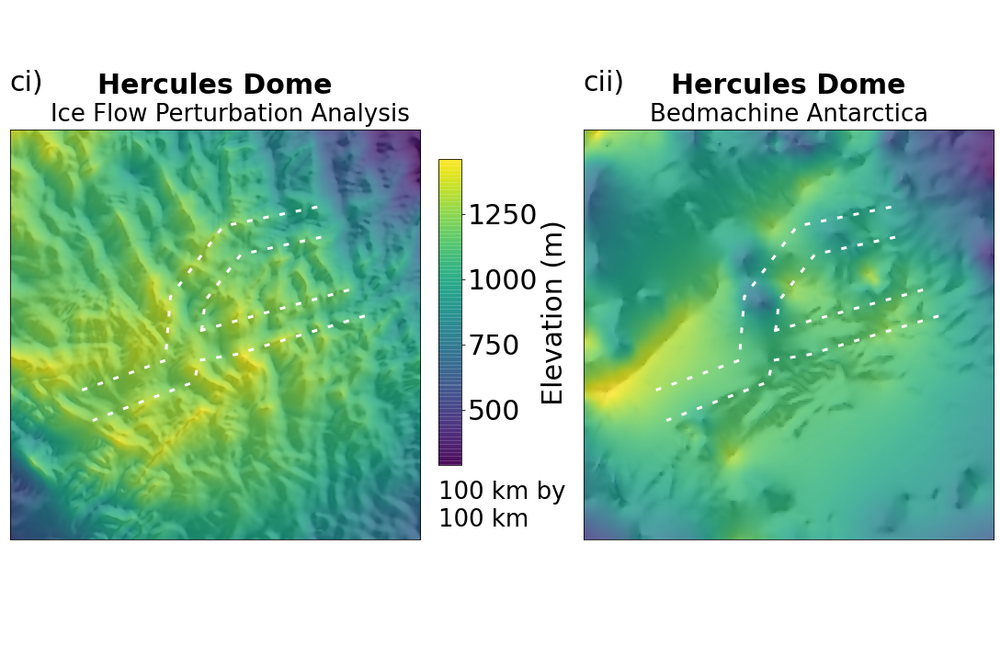

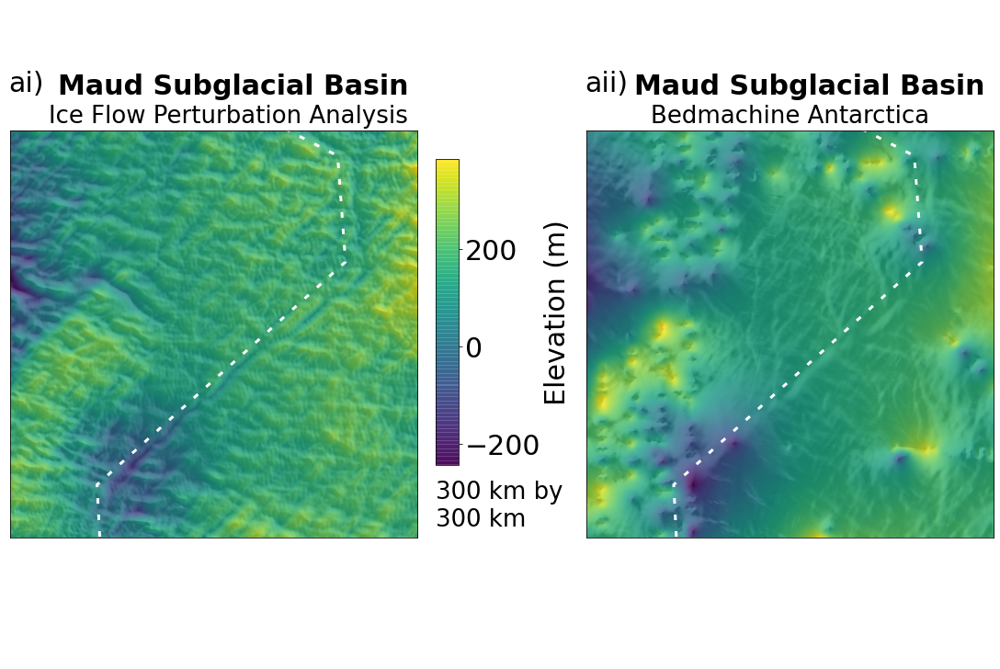

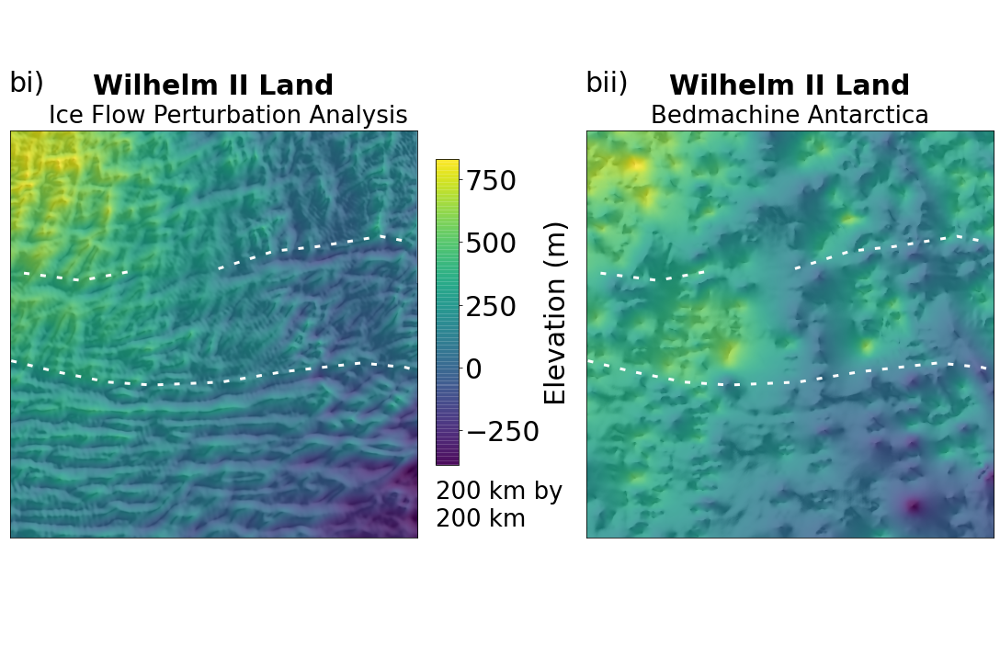

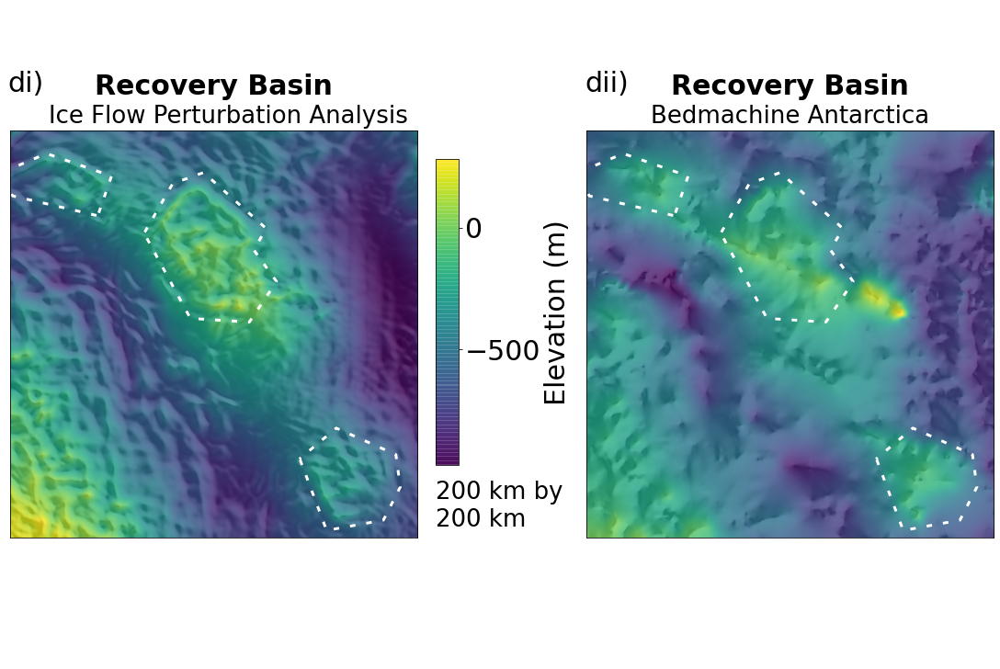

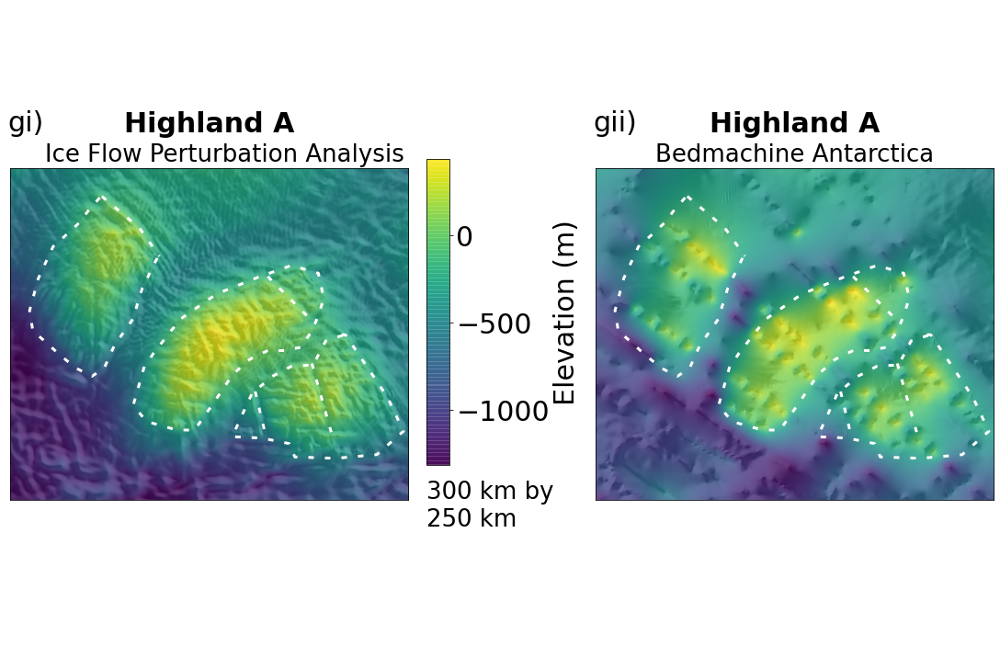

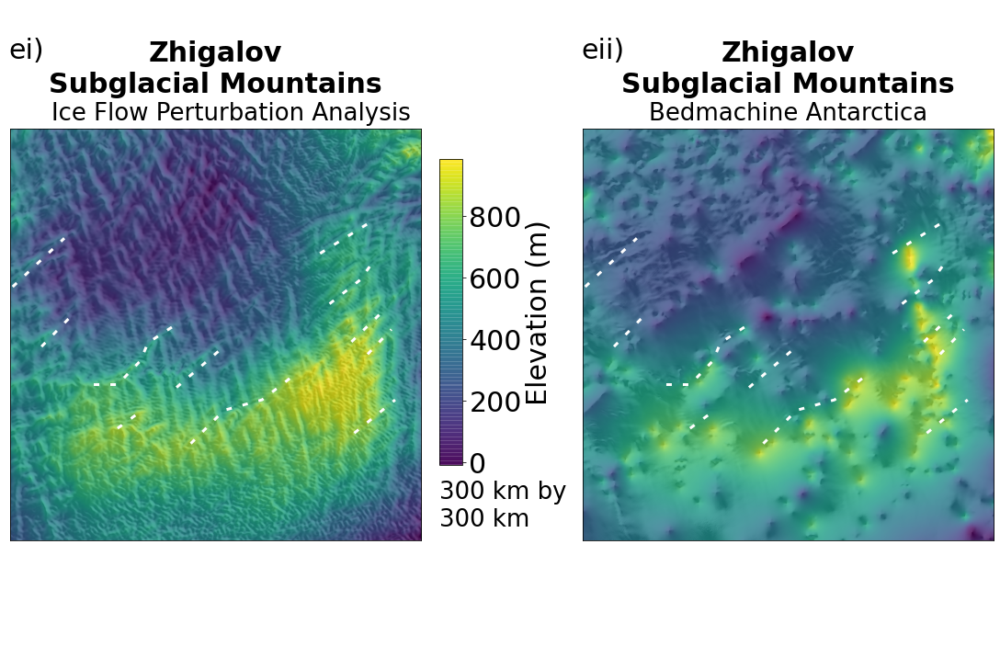

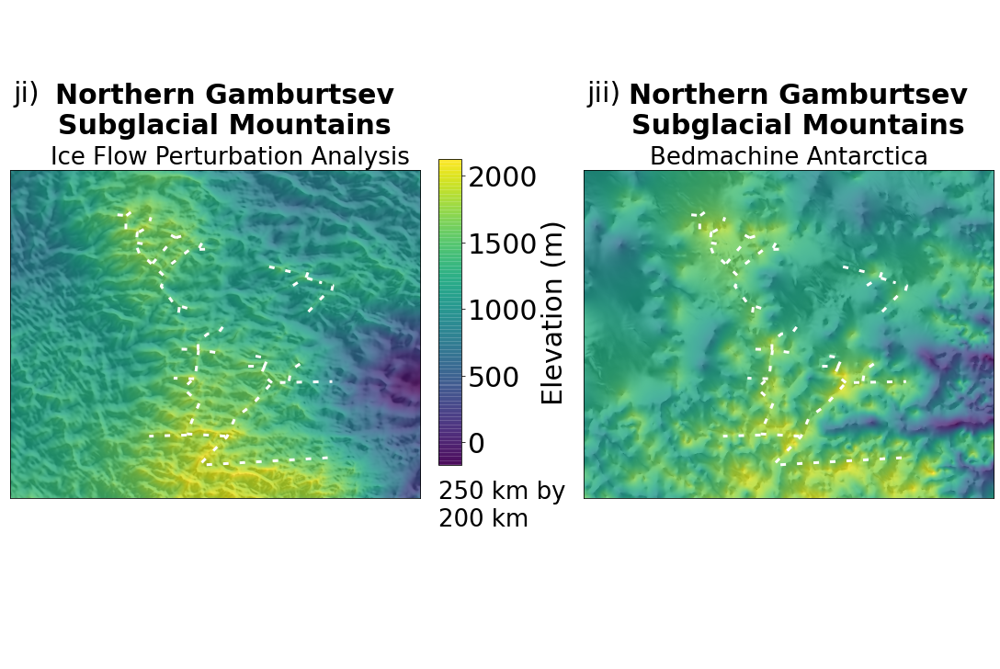

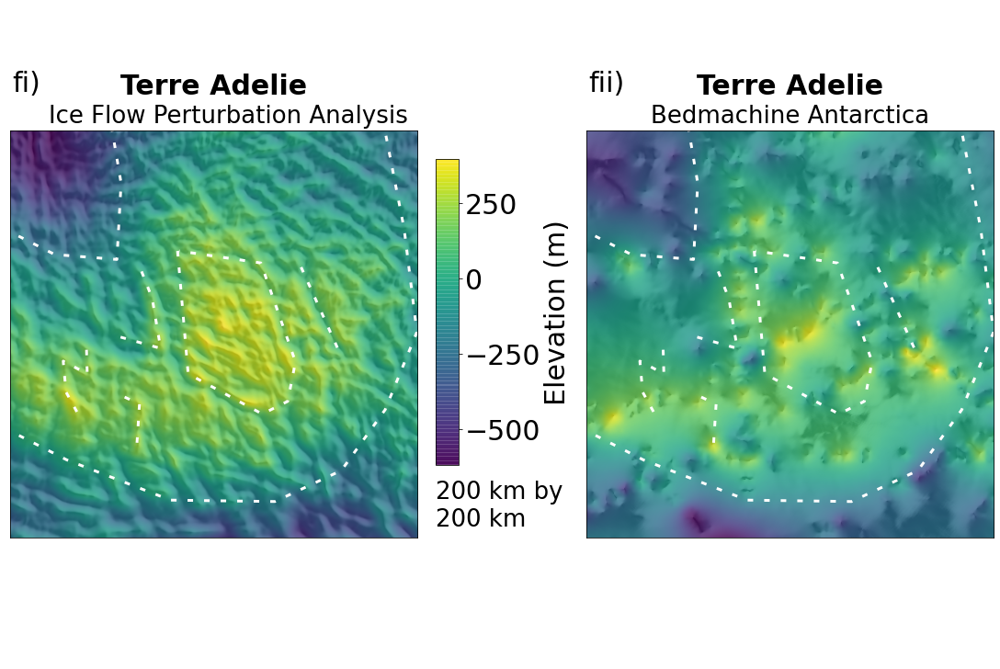

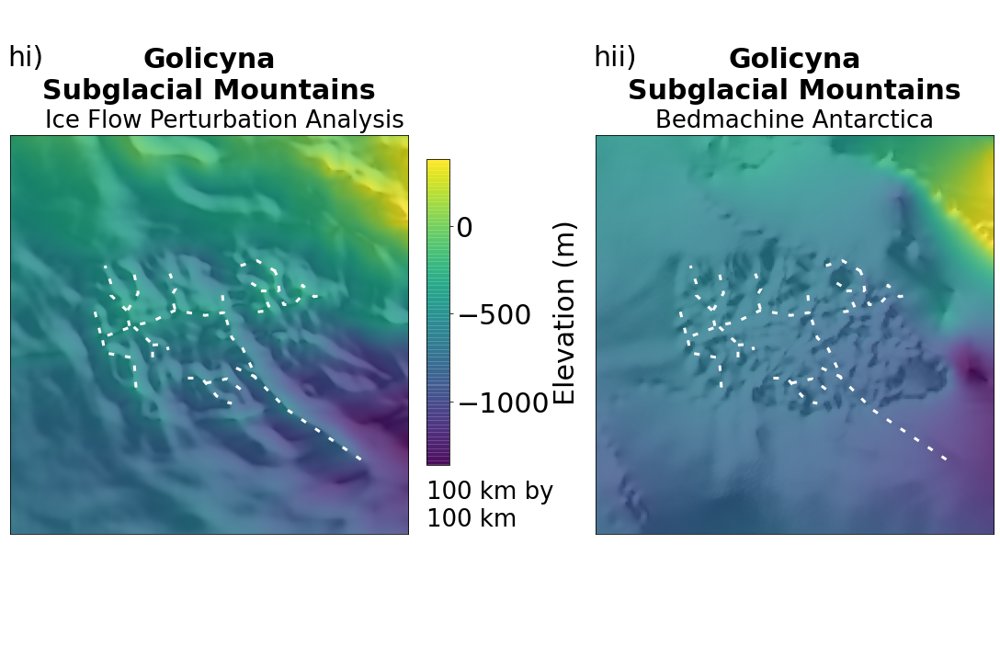

In [9]:
# If requesting plots of all the selected regions
for kk in range(len(bounds2)):
# If only interested in specific regions then specify here
#for kk in (4, 9,11,15):
    # Calculate the width of each region
    x_width  = (bounds2[kk][1] - bounds2[kk][0])/1000
    y_width =  (bounds2[kk][3] - bounds2[kk][2])/1000

    # Set the plot loyout
    ax = [[],[],[],[]]
    fig = plt.figure(constrained_layout=True, figsize = (15,10))
    widths = [6,0.01,6]
    heights = [9.5,0.5]
    gs = fig.add_gridspec(2,3, width_ratios = widths, height_ratios = heights)
    ax[0] = fig.add_subplot(gs[:, 0])
    ax[1] = fig.add_subplot(gs[0, 1])
    ax[2] = fig.add_subplot(gs[:, 2])
    ax[3] = fig.add_subplot(gs[1,1])
    ax[3].axis('off')
    
    # Since IFPA has a resolution of 100m and Bedmachine of 500m, set d = 5, d2 = 1 to plot them on the same resolution
    d = 5
    d2 = 1
    im = [[],[]]
    
    # Decide whether to plot topography with hillshade underlain (hillshade_on = True) or not (hillshade_on = False) 
    hillshade_on = True
    if hillshade_on == True:
        hillshade = es.hillshade(bedmach_2[kk], altitude = 45, azimuth = 315)
        ax[2].imshow(hillshade, extent = bounds2[kk], cmap = 'Greys', zorder = 0, origin = 'upper')
        im[1] = ax[2].imshow(bedmach_2[kk], extent = bounds2[kk], alpha = 0.8, cmap = 'viridis', origin = 'upper')
        hillshade = es.hillshade(bed_ifpa_2[kk], altitude = 45, azimuth = 315)
        ax[0].imshow(hillshade, extent = bounds2[kk], cmap = 'Greys', zorder = 0, origin = 'lower')
        im[0] = ax[0].imshow(bed_ifpa_2[kk], extent = bounds2[kk], zorder = 1, alpha = 0.8, origin = 'lower')
    else:
        im[1] = ax[2].pcolor(X_bedmach_2[kk][::d2,::d2], Y_bedmach_2[kk][::d2,::d2], bedmach_2[kk][::d2,::d2])
        im[0] = ax[0].pcolor(X_ifpa_2[kk][::d,::d], Y_ifpa_2[kk][::d,::d], bed_ifpa_2[kk][::d,::d])

    # Set the titles for each plot 
    titles = ('\n    Ice Flow Perturbation Analysis', '\nBedmachine Antarctica')
    # Customise to the specific area 
    titles2 = labels_flat[kk][0] + '\n'
    ax[0].annotate(titles[0], xy=(2, 1), xytext=(0.5, 1.02), xycoords = 'axes fraction', fontsize = 26, ha = 'center');
    ax[2].annotate(titles[1], xy=(2, 1), xytext=(0.5, 1.02), xycoords = 'axes fraction', fontsize = 26, ha = 'center');
    # Set the color limits for the plots to cover both Bedmachine and IFPA 
    clims = (np.min((np.min(bedmach_2[kk]), np.nanmin(bed_ifpa_2[kk]))), \
             np.max((np.max(bedmach_2[kk]), np.nanmax(bed_ifpa_2[kk]))))

    letter = letters2[kk]
    
    # Some plots have long names, so for these plots set the plot label to appear 
    # on the 2nd line above the frame rather than the first 
    if kk in (5,6,8):
        ax[0].annotate('{}i)\n\n'.format(letter), xy=(2, 1), xytext=(0.04, 1.02), xycoords = 'axes fraction', \
                       fontsize = 30, ha = 'center');
        ax[2].annotate('{}ii)\n\n'.format(letter), xy=(2, 1), xytext=(0.05, 1.02), xycoords = 'axes fraction', \
                       fontsize = 30, ha = 'center');
    else:
        ax[0].annotate('{}i)\n'.format(letter), xy=(2, 1), xytext=(0.04, 1.02), xycoords = 'axes fraction', \
                       fontsize = 30, ha = 'center');
        ax[2].annotate('{}ii)\n'.format(letter), xy=(2, 1), xytext=(0.05, 1.02), xycoords = 'axes fraction', \
                       fontsize = 30, ha = 'center');
    
    # Plot in white dashed line the outline of features chosen to be significant 
    for i in (0,2):
        groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='k')
        ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);   
        ECR_features.plot(ax = ax[i], linestyle=(0,(2,4)), \
                          edgecolor = 'white', linewidth = 3, zorder = 2)

    # 
    for i in range(2):
        # Set x and y limits to the bounds of the region
        ax[2*i].set_xlim(bounds2[kk][0], bounds2[kk][1])
        ax[2*i].set_ylim(bounds2[kk][2], bounds2[kk][3])
        # Plot titles
        ax[2*i].set_title(titles2, fontsize = 30, fontweight = 'bold')
        # Set color limit if desired
        # im[i].set_clim(clims)
    
    cbar = plt.colorbar(im[0], ax = ax[1], shrink = 0.5)
    cbar.set_label('Elevation (m)', fontsize = 30)
    cbar.ax.tick_params(labelsize=30)
    ax[1].axis('off');
    cbar.ax.annotate('{:.0f} km by\n{:.0f} km'.format(x_width, y_width), \
                   xy=(2, 1), xytext=(0, -0.2), xycoords = 'axes fraction', fontsize = 26);
    
    # Save the figure to file 
    fig.savefig(figures_folder + '01_' +letter + '_' + labels_flat2[kk][0] + '.png', dpi = 200, bbox_inches = 'tight')

**Panel k** 

The outline of the selected regions on an overall map of Antarctica 

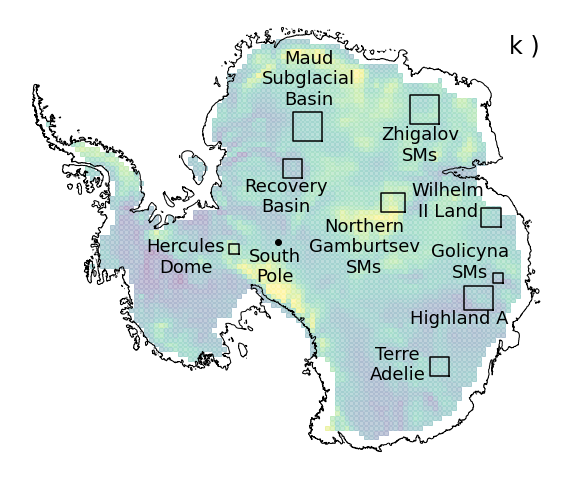

In [10]:
# To plot the selected regions on an overall map of Antarctica (Panel k)
# All the grids
group_1 = (0,1,2,3,4,5,6,7,8)
# If requesting only a specific range of patches 
group_2 = ()
chosing = 'group_1' 

fig, ax = plt.subplots(1,1, figsize = (10,10))
im = plt.scatter(x_ifpa, y_ifpa, c =  mean_ifpa, s = 15, marker = 's', alpha = 0.3, zorder = 0)
im.set_clim(-2000,2000)

# Plot the outlines of grids in group 1 in color_1, with transparency alpha_1
# Plot the outlines of grids in group 2 in color_2, with transparency alpha_2
if chosing == 'group_1':
    color_1 = 'k'
    color_2 = '#2f64b4'
    alpha_1 = 1
    alpha_2 = 0.7
    ax.annotate('k )', xy = (1,2), xytext = (0.9,0.9), xycoords = 'axes fraction', fontsize = 24)
else:
    color_1 = '#2f64b4'
    color_2 = 'k'
    alpha_1 = 0.7
    alpha_2 = 1
    ax.annotate('h)', xy = (1,2), xytext = (0.9,0.9), xycoords = 'axes fraction', fontsize = 14)

# Plot the outlines of grids in group 1 in color_1, with transparency alpha_1
# Plot the outlines of grids in group 2 in color_2, with transparency alpha_2
for i in group_1:
    geom = box(bounds2[i][0], bounds2[i][2], bounds2[i][1], bounds2[i][3])
    ax.plot(*geom.exterior.xy, color = color_1, zorder = 2, alpha = alpha_1)
    ax.annotate(labels[i][0], xy=(2, 1), xytext=labels[i][1], xycoords = 'axes fraction', \
                fontsize = 18, color = color_1, ha = 'center', alpha = alpha_1);
for i in group_2:
    geom = box(bounds2[i][0], bounds2[i][2], bounds2[i][1], bounds2[i][3])
    ax.plot(*geom.exterior.xy, color = color_2, zorder = 1, alpha = alpha_2)
    ax.annotate(labels[i][0], xy=(2, 1), xytext=labels[i][1], xycoords = 'axes fraction', \
                fontsize = 12, color = color_2, ha = 'center', alpha = alpha_2);

# Plot the grounding line of Antarctica to provide spatial orientation 
groundinglineM.plot(ax = ax, facecolor = 'None', edgecolor='k', zorder = 0)
# Remove the external axes of the plot for simplicity 
ax.get_xaxis().set_ticks([]); ax.get_yaxis().set_ticks([]);   
ax.axis('off');

# Plotting the location of the South Pole to orient users who may be less familiar with its location
ax.scatter(0,0, color = 'k')
ax.annotate('South\nPole', xy=(2, 1), xytext=(0.48,0.41), xycoords = 'axes fraction', \
                fontsize = 18, color = color_1, ha = 'center', alpha = alpha_1);

# Save the figure to file
fig.savefig(figures_folder + '01_k_Locations.png', dpi = 200, bbox_inches = 'tight')

### Figure 2 

**The texture of Antarctica’s ice-sheet bed.** (a) The number of 50 m hills within a 5
km radius extracted from new IFPA subglacial topography. (b) The number of 50 m hills within a
5 km radius extracted from topography previously interpolated between geophysically-derived bed
picks from BedMachine Antarctica [22] (c) The Fourier fractal dimension for wavelengths > 5 km
\- a proxy for subglacial-landscape roughness – extracted from new IFPA topography. (d) Fourier
fractal dimension for wavelengths > 5km extracted from BedMachine. (e) Locations of bed picks
used to derive BedMachine (Adapted from Figure 2 of the Bedmachine v3 User Guide [22]). The most densely surveyed regions of East Antarctica are annotated: Dome Fuji, Gamburtsev Subglacial Mountains (GSM), Lake Vostok and Dome C. Note the significant correspondence between the spatial patterns produced in (b) and (d) and geophysical-survey locations
(e). By contrast, panels (a) and (c) show that with IFPA we can now calculate subglacial-landscape
texture across Antarctica consistently, without bias from geophysical-survey locations. 

NOTE: Panel e) in the manuscript is adapted from Figure 2 of the Bedmachine v3 User Guide, DOI: 10.5067/FPSU0V1MWUB6

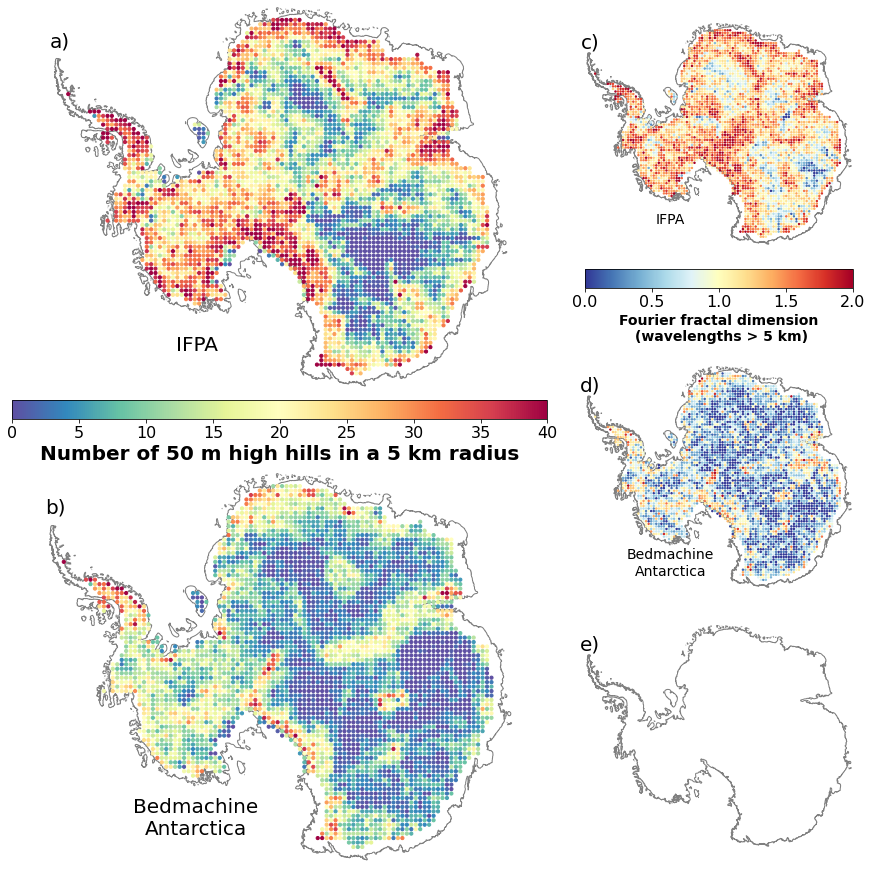

In [11]:
fig = plt.figure(constrained_layout=True, figsize = (12,12))
heights = [4, 0.3, 1.7, 0.3, 2, 4]
widths = [4,2]
gs = fig.add_gridspec(6,2, width_ratios = widths, height_ratios = heights)
ax = [[],[],[],[],[],[],[],[]]
ax[0] = fig.add_subplot(gs[0:3, 0])
ax[1] = fig.add_subplot(gs[4:, 0])
ax[2] = fig.add_subplot(gs[0, 1])
ax[3] = fig.add_subplot(gs[2:5,1])
ax[4] = fig.add_subplot(gs[5,1])
ax[5] = fig.add_subplot(gs[3,0])
ax[6] = fig.add_subplot(gs[1,1])

letters = ['a)','b)','c)', 'd)', 'e)','f)','g)']

for i in range(5):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='grey')
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);
    ax[i].axis('off')
    ax[i].set_xlim(-2.55e6,2.7e6)
    ax[i].set_ylim(-2.2e6,2.2e6)
    ax[i].annotate(letters[i], xy = (1,2), xytext = (0.02,0.91), xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', fontsize = 20)

plots = [ifpa_count, bedmach_count, 3+ ifpa_b1_5km/2, 3+ bedmach_b1_5km/2]
cmaps = ['Spectral_r', 'Spectral_r', 'RdYlBu_r', 'RdYlBu_r']
sizes = [10,10,2,2,2,2]
clims = [[0,40],[0,40],[0,2],[0,2]]
labels = ['Number of 50 m high hills in a 5 km radius', 'Fourier fractal dimension\n (wavelengths > 5 km)']
fontsizes = [20,14]

for i in range(4):
    im = ax[i].scatter(x_ifpa, y_ifpa, c = plots[i], cmap = cmaps[i], s = sizes[i]) 
    im.set_clim(clims[i])
    
    if i in (0,2):
        cb = plt.colorbar(im, cax = ax[int((i/2) + 5)], orientation = 'horizontal')
        cb.set_label(labels[int(i/2)], fontsize = fontsizes[int(i/2)], fontweight = 'bold')
        cb.ax.tick_params(labelsize=16) 
        ax[i].annotate('IFPA', xy = (1,2), xytext = (0.32,0.12), xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', fontsize = fontsizes[int(i/2)])
        ax[i+1].annotate('Bedmachine\nAntarctica', xy = (1,2), xytext = (0.32,0.12), xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', fontsize = fontsizes[int(i/2)])

# Save figure to folder
fig.savefig(figures_folder + '02_Metrics.png', dpi = 200, bbox_inches = 'tight')

### Figure 3 

**Geomorphological classification of Antarctica’s subglacial landscape.** (a) Applica-
tion to new IFPA subglacial topography; (b) Previous classification applied in 2013 to interpolated
bed-topography (Bedmap2) [79], adapted from Jamieson et al. [67]. In each panel the classification
shows regions of low relief, alpine style (both fully submerged - subglacial, and partially submerged
\- subaerial) and selectively-eroded landscapes. (c) Locations labelled in text: Adv. ST - Adventure
Subglacial Trench, Amu. SS - Amundsen Sea Sector, AP - Antarctic Peninsula, Ast SB - Astro-
labe Subglacial Basin, Aur SB – Aurora Subglacial Basin, DML - Dronning Maud Land, GaSM -
Gamburtsev Subglacial Mountains, GoSM - Golicyna Subglacial Mountains, HA - Highland A, HB -
Highland B, LV - Lake Vostok, MSB - Maud Subglacial Basin, PEL - Princess Elizabeth Land, PPB
\- Pensacola-Pole Basin, RSLs - Recovery Subglacial Lakes, SC - the Siple Coast, SPB - South Pole
Basin, TAM - Transantarctic Mountains, VSH - Vostok Subglacial Highlands, WSB - Wilkes Sub-
glacial Basin, ZSM - Zhigalov Subglacial Mountains.

Note: Panel b) in the manuscript is adapted from Figure 8 of Jamieson et al. (2014), DOI: 10.1017/S0954102014000212

In [12]:
mountain_mask = (extract_from_matrix('i_rms_slope_h') > 2) + \
                (extract_from_matrix('ifpa_count_max_250') > 10) 
#                + (extract_from_matrix('ifpa_relief') > 1250)

SGM_mask =  ((~mountain_mask)) & \
            (((extract_from_matrix('ifpa_mean') > 1000)) + (extract_from_matrix('i_std_l') > 19))
SGM_mask2 = (~mountain_mask) & (~SGM_mask) & \
                (extract_from_matrix('ifpa_b1_thickness') > -5.0)  & \
            (extract_from_matrix('ifpa_rms_slope') < 1.1) & \
            (extract_from_matrix('ifpa_mean') > 500)

poordetail_mask = (~mountain_mask) & (~SGM_mask) & (~SGM_mask2) & \
                    ((extract_from_matrix('ifpa_rms_curvature') < 0.025) + \
                    (extract_from_matrix('ifpa_count_max_20') < 15) + \
                    (extract_from_matrix('i_rms_slope_h') < 0.07))
dunes_mask = (~poordetail_mask) & (~mountain_mask) & (~SGM_mask) & (~SGM_mask2) & \
                ((extract_from_matrix('ifpa_rms_slope')/extract_from_matrix('ifpa_rms_curvature')) < 14.75) & \
                (extract_from_matrix('ifpa_rms_slope') < 0.9) & (extract_from_matrix('ifpa_wav_max_power') < 5000) & \
                (extract_from_matrix('ifpa_count_max_100') == 0) #& \




icestreams_mask = (~mountain_mask) & (~poordetail_mask) & (~dunes_mask) & (~SGM_mask) & (~SGM_mask2) & \
                    (extract_from_matrix('ifpa_b1_thickness') < -5.5) & \
                    (extract_from_matrix('ifpa_rms_slope') > 1.0)
icestreams_mask2 = (~mountain_mask) & (~poordetail_mask) & (~dunes_mask) &  (~SGM_mask) & (~SGM_mask2) & (~icestreams_mask) 

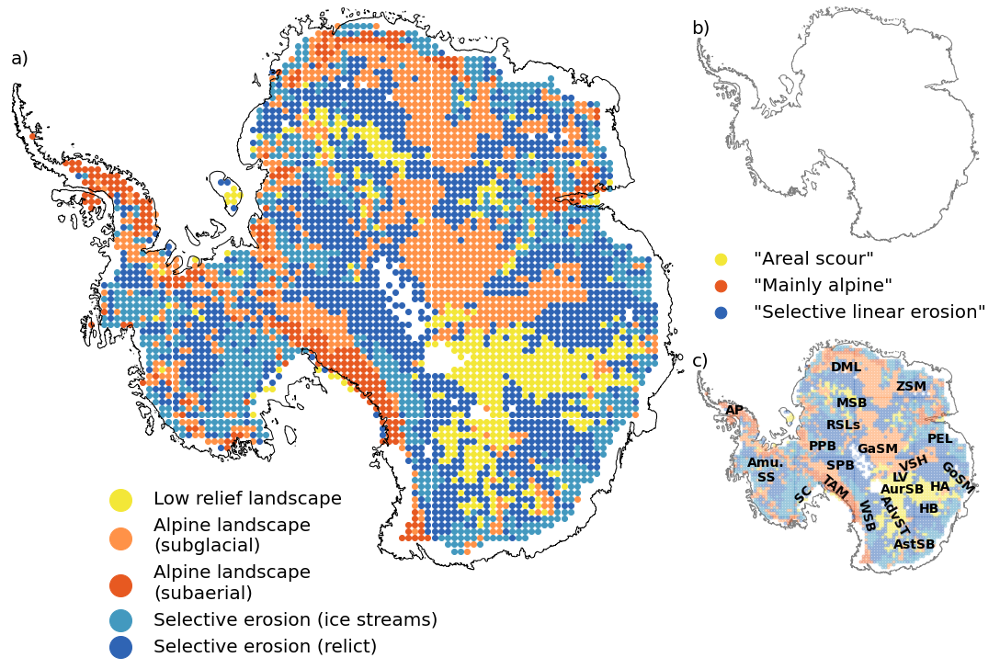

In [13]:
fig = plt.figure(constrained_layout=True, figsize = (15,10))
widths = [5.6,0.05,2.55]
heights = [3,0, 3]
gs = fig.add_gridspec(3,3, width_ratios = widths, height_ratios = heights)
ax = [[],[],[],[]]
ax[0] = fig.add_subplot(gs[0:3, :2])
ax[1] = fig.add_subplot(gs[0, 1:3])
ax[2] = fig.add_subplot(gs[2, 1:3])
#ax[3] = fig.add_subplot(gs[1,2])
#ax[3].axis('off')
ax[3] = fig.add_subplot(gs[0,1])
ax[3].axis('off')

color_map =plt.cm.get_cmap(plt.cm.rainbow)

ax[0].scatter(x_ifpa[poordetail_mask], y_ifpa[poordetail_mask], c = '#f3e738', \
              label = 'Low relief landscape')#
ax[0].scatter(x_ifpa[SGM_mask], y_ifpa[SGM_mask], c = '#ff9248')
ax[0].scatter(x_ifpa[SGM_mask2], y_ifpa[SGM_mask2], c = '#ff9248', \
              label = 'Alpine landscape\n(subglacial)')
ax[0].scatter(x_ifpa[mountain_mask], y_ifpa[mountain_mask], c = '#e75921', \
              label = 'Alpine landscape\n(subaerial)')
ax[0].scatter(x_ifpa[icestreams_mask], y_ifpa[icestreams_mask], c  = '#4399bf', \
              label = 'Selective erosion (ice streams)')
ax[0].scatter(x_ifpa[icestreams_mask2], y_ifpa[icestreams_mask2], color = '#2f64b4', \
              label = 'Selective erosion (relict)')
ax[0].scatter(x_ifpa[dunes_mask], y_ifpa[dunes_mask], color = 'white')

edgecolors = ['k', 'grey', 'grey']
for i in range(3):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor=edgecolors[i])
    ax[i].set_xlim(-2.55e6,2.7e6)
    ax[i].set_ylim(-2.2e6,2.2e6)
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);   
    ax[i].axis('off');

kw = {'alpha': 0.3, 's': 10}
ax[2].scatter(x_ifpa[poordetail_mask], y_ifpa[poordetail_mask], c = '#f3e738', label = 'Areal scour '+r'(?)', **kw)#
ax[2].scatter(x_ifpa[SGM_mask], y_ifpa[SGM_mask], c = '#ff9248', **kw)
ax[2].scatter(x_ifpa[SGM_mask2], y_ifpa[SGM_mask2], c = '#ff9248', label = 'Alpine (subglacial)', **kw)
ax[2].scatter(x_ifpa[mountain_mask], y_ifpa[mountain_mask], c = '#e75921', label = 'Alpine (aerial)', **kw)
ax[2].scatter(x_ifpa[icestreams_mask2], y_ifpa[icestreams_mask2], color = '#2f64b4', label = 'Selective linear erosion', **kw)
ax[2].scatter(x_ifpa[icestreams_mask], y_ifpa[icestreams_mask], c  = '#4399bf', label = 'Ice streams', **kw)
ax[2].scatter(x_ifpa[dunes_mask], y_ifpa[dunes_mask], color = 'white', **kw)

kw = {'alpha': 0, 's': 10}
ax[1].scatter(x_ifpa[poordetail_mask], y_ifpa[poordetail_mask], c = '#f3e738', \
              label = '"Areal scour"', **kw)#
ax[1].scatter(x_ifpa[mountain_mask], y_ifpa[mountain_mask], c = '#e75921', label = '"Mainly alpine"', **kw)
ax[1].scatter(x_ifpa[icestreams_mask2], y_ifpa[icestreams_mask2], color = '#2f64b4', \
              label = '"Selective linear erosion"', **kw)


places = [['AurSB', (0.73, 0.37), 0], 
          ['AstSB', (0.77, 0.14), 0], 
          ['GaSM', (0.64,0.54), 0], 
          ['LV', (0.72,0.42), 0], 
          ['DML', (0.53, 0.88), 0], 
          ['RSLs', (0.52,0.64), 0], 
          ['AP', (0.14,0.7), -0],
          ['TAM', (0.49, 0.38), -40],  
          ['HA', (0.86, 0.38), 0], 
          ['ZSM', (0.76, 0.80), 0], 
          ['HB', (0.82,0.29), 0], 
          ['SC', (0.38,0.35), 45], 
          ['Amu.\nSS', (0.25,0.45), 0], 
          ['PPB', (0.45,0.55), 0], 
          ['WSB', (0.60, 0.26), -75], 
          ['MSB', (0.55, 0.73),0], 
          ['AdvST', (0.7, 0.26), -60], 
          ['VSH', (0.77,0.48), 20], 
          ['GoSM', (0.92, 0.42), -45], 
          ['PEL', (0.86, 0.58), 0], 
          ['SPB', (0.51,0.47), 0]]


for kk in range(len(places)):
    ax[2].annotate(places[kk][0], xy = (1,2), xytext = places[kk][1], xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', rotation = places[kk][2], fontsize = 14, fontweight = 'bold')
#ax[1].scatter(x_ifpa, y_ifpa, c =  mean_ifpa, s = 40, marker = 's', alpha = 0.3, zorder = 0, edgecolors=None)
#fig.tight_layout()   

ax[0].legend(loc = (0.13,-0.15), fontsize = 20, frameon=False,markerscale=4)#.set_zorder(0)
leg = ax[1].legend(loc = (0,-0.35), fontsize = 20, frameon=False,markerscale=4)#.set_zorder(0)
# Set the alpha value for the legend handles (make markers fully opaque)
for lh in leg.legendHandles:
    lh.set_alpha(1)

labels_letters = ('a)', 'b)', 'c)')
for jk in range(3):
    ax[jk].annotate(labels_letters[jk], xy = (1,2), xytext = (0.02,0.91), xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', fontsize = 20)

fig.savefig(figures_folder + '03_Textural_map.png', dpi = 200, bbox_inches = 'tight')

### Figure 4 

**Steps in the Ice Flow Perturbation Analysis methodology.** A schematic illustrating
the order in which various steps are carried out when Ice Flow Perturbation Analysis is applied to a
single patch. Step numbers correspond to the description in Section 6.1.1.

Note: This figure was created in Inkscape

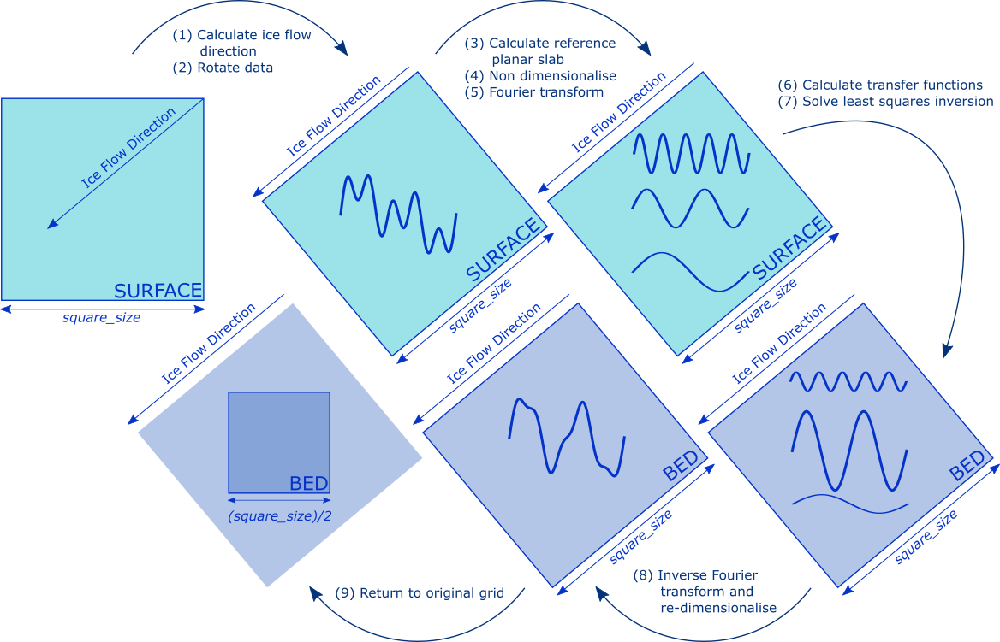






### Figure 5

**Combining multiple patches across a domain.** A schematic diagram to illustrate the
steps taken when combining multiple overlapping patches to produce a smooth data product over a
larger area.

Note: This figure was created in Inkscape

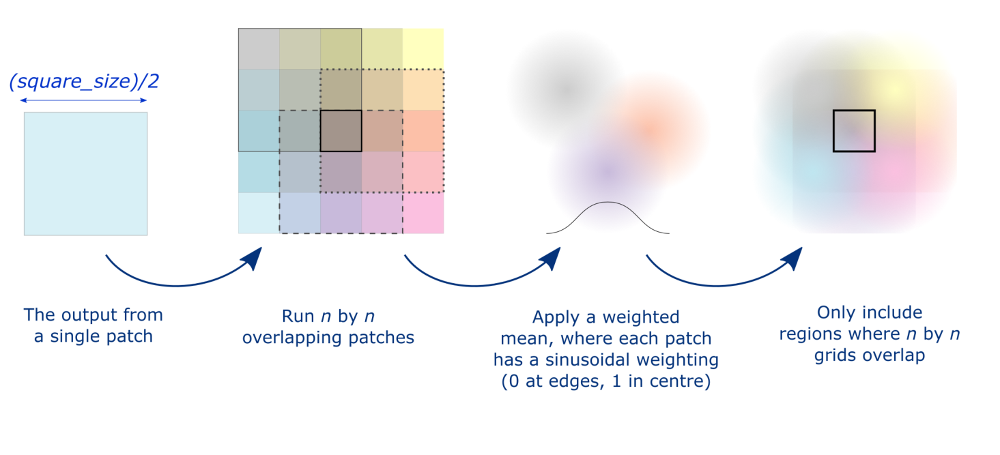

### Figure 6

**The level of detail provided by the reference baseline topography.** A comparison
for the eastern Thwaites Glacier regions of (a) bed topography from Bedmachine Antarctica [22], (b)
the level of detail provided by the 50 km diameter smoothed Bedmachine Antarctica thickness used
in the Ice Flow Perturbation methodology, and (c) bed topography from IFPA. In panel (b), each
individual square pixel is 8.3 km square (square size/2n).

In [14]:
bounds = [-1.25e6, -1.15e6, -0.3e6, -0.2e6] # Thwaites Glacier 

In [15]:
# Extend bounds slightly for importing data
bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
# Create a shapely geometry file for bounds to plot them later
geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
# Import the ITSLIVE, REMA and Bedmachine data
X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach, Y_bedmach, thick, bedmach, errbed, source = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
# To load the IFPA data
fh = Dataset(filepath_ifpa, 'r', format = 'NETCDF4');
X = fh.variables['x'][:]
Y = fh.variables['y'][:]
xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
X_ifpa = fh.variables['x'][xl:xh]
Y_ifpa = fh.variables['y'][yl:yh]
X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
fh.close()
# Calculate the width of the plot
x_width  = (bounds[1] - bounds[0])/1000
y_width =  (bounds[3] - bounds[2])/1000

C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # Remove the CWD from sys.path while we load stuff.
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by Interactiv

In [16]:
# Create an array of the points for the smoothed grid display
X_points = np.arange(X_bedmach.min(), X_bedmach.max()+1, 25000/3)
Y_points = np.arange(Y_bedmach.min(), Y_bedmach.max()+1, 25000/3)
X_points, Y_points = np.meshgrid(X_points, Y_points)

In [17]:
# For each point in this smoothed grid, calculate the mean elevation of the bed topography 
surface = np.ndarray(X_points.shape)
thickness = np.ndarray(X_points.shape)
mean_bedmach = np.ndarray(X_points.shape)
for i,j in itertools.product(range(X_points.shape[0]), range(X_points.shape[1])):
    bounds = [X_points[i,j] - 25000, X_points[i,j]+25000, Y_points[i,j] - 25000, Y_points[i,j]+25000]
    _, _, _, _, _, _, SURF, _, _, thick, bedmach, _, _ = \
        smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_bedmach)
    surface[i,j], thickness[i,j], mean_bedmach[i,j] = np.mean(SURF), np.mean(thick), np.mean(bedmach)

In [18]:
bounds = [-1.25e6, -1.15e6, -0.3e6, -0.2e6]
# Extend bounds slightly for importing data
bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
# Create a shapely geometry file for bounds to plot them later
geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
# Import the ITSLIVE, REMA and Bedmachine data
X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach, Y_bedmach, thick, bedmach, errbed, source = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
# To load the IFPA data
fh = Dataset(filepath_ifpa, 'r', format = 'NETCDF4');
X = fh.variables['x'][:]
Y = fh.variables['y'][:]
xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
X_ifpa = fh.variables['x'][xl:xh]
Y_ifpa = fh.variables['y'][yl:yh]
X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
fh.close()
# Calculate the width of the patch
x_width  = (bounds[1] - bounds[0])/1000
y_width =  (bounds[3] - bounds[2])/1000

C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if sys.path[0] == '':
C:\Users

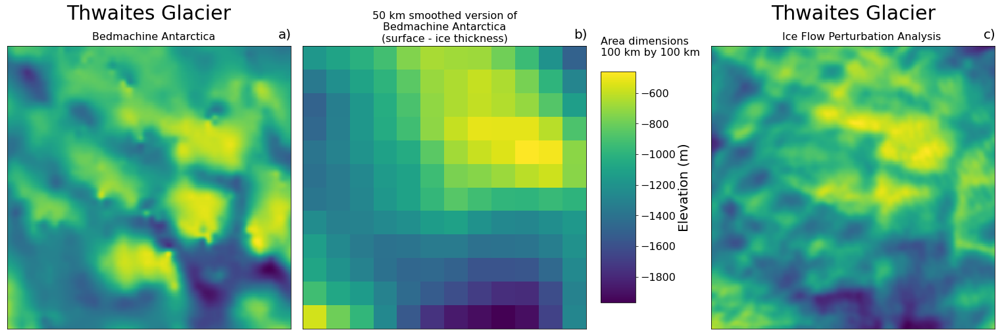

In [19]:
# Plot the data once imported`
#fig, ax = plt.subplots(1,4, figsize = (20,10), widths = (6,1,6,6))
ax = [[],[],[],[]]
fig = plt.figure(constrained_layout=True, figsize = (21,7))
widths = [6,6,0.01,6]
gs = fig.add_gridspec(1,4, width_ratios = widths)
ax[0] = fig.add_subplot(gs[0, 0])
ax[1] = fig.add_subplot(gs[0, 2])
ax[2] = fig.add_subplot(gs[0, 3])
ax[3] = fig.add_subplot(gs[0, 1])

d = 5
d2 = 1
im = [[],[]]
im[0] = ax[0].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach[::d2,::d2])
im[1] = ax[2].pcolor(X_ifpa[::d,::d], Y_ifpa[::d,::d], bed_ifpa[::d,::d])
#ax[3].plot(*geom.exterior.xy, color = 'r')
titles = ('\nBedmachine Antarctica', '\nIce Flow Perturbation Analysis')
titles2 = ('Thwaites Glacier\n', 'Thwaites Glacier\n')
clims = (np.min((np.min(bedmach), np.nanmin(bed_ifpa))), np.max((np.max(bedmach), np.nanmax(bed_ifpa))))

ax[0].annotate(titles[0], xy=(2, 1), xytext=(0.3, 1.02), xycoords = 'axes fraction', fontsize = 16);
ax[2].annotate(titles[1], xy=(2, 1), xytext=(0.25, 1.02), xycoords = 'axes fraction', fontsize = 16);


for i in (0,2, 3):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='k')
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);   
    

for i in range(2):
    ax[2*i].set_xlim(bounds[0], bounds[1])
    ax[2*i].set_ylim(bounds[2], bounds[3])
#    ax[2*i].set_xlabel(titles[i], fontsize = 20)
#    ax[2*i].set_title(titles[i], fontsize = 20)
    ax[2*i].set_title(titles2[i], fontsize = 30)
#    im[i].set_clim(clims)
#    im[i].set_clim(-1000,500)
#    im[i].set_clim(None, 500)

cbar = plt.colorbar(im[0], ax = ax[1], shrink = 0.8)
cbar.set_label('Elevation (m)', fontsize = 20)
cbar.ax.tick_params(labelsize=16)
ax[1].axis('off');
#ax[3].axis('off');
cbar.ax.annotate('Area dimensions\n{:.0f} km by {:.0f} km\n'.format(x_width, y_width), \
               xy=(2, 1), xytext=(0, 1.02), xycoords = 'axes fraction', fontsize = 16);
#plt.title('Canyon Basin', fontsize = 20)
labels_c5 = ('a)','','c)','b)')
for i in (0, 3, 2):
    ax[i].annotate('{}'.format(labels_c5[i]), xy = (2,1), xytext = (0.98,1.04), xycoords = 'axes fraction', \
                   ha = 'center', va = 'center', fontsize = 20)


ax[3].pcolor(X_points, Y_points, surface - thickness)
ax[3].set_xlim(bounds[0], bounds[1])
ax[3].set_ylim(bounds[2], bounds[3])
ax[3].set_title('50 km smoothed version of\nBedmachine Antarctica\n(surface - ice thickness)', fontsize = 16)

fig.savefig(figures_folder + '06_50km_smoothing.png', dpi = 200, bbox_inches = 'tight')

### Figure 7 

**Examples of artefacts in the IFPA topography from surface data sets.** Subglacial
topography produced from Ice Flow Perturbation Analysis can have artefacts produced by a) features
in the ice surface which are not produced by ice flow processes, in this case megadunes formed by
katabatic winds, and b) artefacts in the surface data, in this case velocity artefacts caused by proximity
to the South Pole. Panels show 1) topography from Bedmachine Antarctica [22], 2) topography from
Ice Flow Perturbation Analysis, 3) the ice-surface elevation [49, 50] and 4) the ice-surface velocity in
the x direction [51] for these two regions.

Note: This code produces separate figures for panels a) and b)

C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:27: Depr

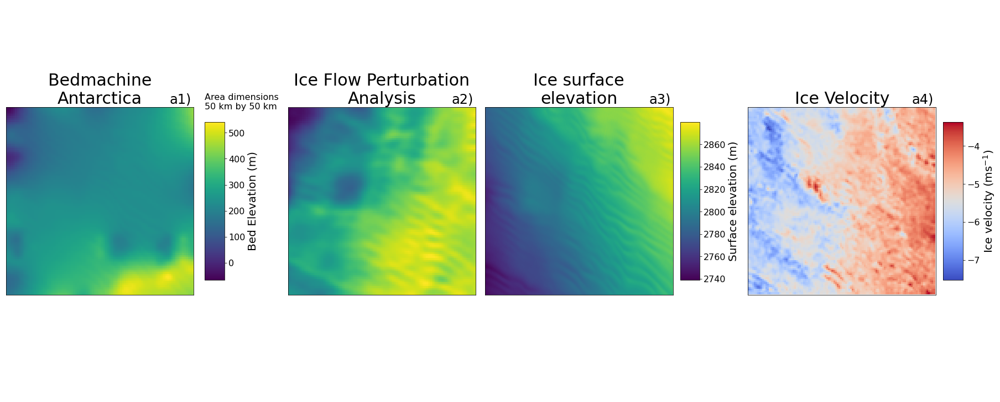

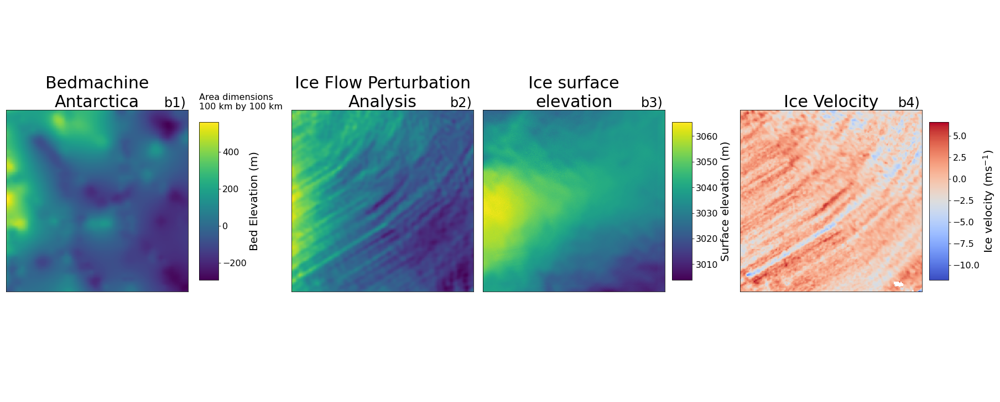

In [20]:
### Artefacts
# Set the coordinate boundaries for the example regions for surface artefacts and velocity artefacts 
bounds_art = np.ndarray(2, dtype = np.ndarray)
bounds_art[0] = [1.0e6, 1.05e6, -0.95e6, -0.9e6] # Surface artefacts
bounds_art[1] = [0.1e6, 0.2e6, -0.2e6, -0.1e6] # Velocity artefacts

labels_art = ['a','b']
filenames_art = ['Surface_artefacts', 'Velocity_artefacts']

for kk in range(len(bounds_art)):
    bounds = bounds_art[kk]
    # Extend bounds slightly for importing data
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Create a shapely geometry file for bounds to plot them later
    geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
    # Import the ITSLIVE, REMA and Bedmachine data
    X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach, Y_bedmach, thick, bedmach, errbed, source = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    # To load the IFPA data
    fh = Dataset(filepath_ifpa, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa = fh.variables['x'][xl:xh]
    Y_ifpa = fh.variables['y'][yl:yh]
    X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
    fh.close()
    
    # Calculate the dimensions of the plot 
    x_width  = (bounds[1] - bounds[0])/1000
    y_width =  (bounds[3] - bounds[2])/1000

    # Set the grids for the plot 
    ax = [[],[],[],[],[]]
    fig = plt.figure(constrained_layout=True, figsize = (25,10))
    widths = [6,0.01,6,6,6]
    gs = fig.add_gridspec(1,5, width_ratios = widths)
    ax[0] = fig.add_subplot(gs[0, 0])
    ax[1] = fig.add_subplot(gs[0, 1])
    ax[2] = fig.add_subplot(gs[0, 2])
    ax[3] = fig.add_subplot(gs[0, 3])
    ax[4] = fig.add_subplot(gs[0, 4])

    # Since IFPA is gridded at 100m and Bedmachine at 500m, set d = 5 and d2 = 1 to have the same resolution for both
    d = 5
    d2 = 1
    im = [[],[],[],[]]
    # Plot bedmachine, IFPA, REMA and ITSLIVE for the chosen region
    im[0] = ax[0].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach[::d2,::d2])
    im[1] = ax[2].pcolor(X_ifpa[::d,::d], Y_ifpa[::d,::d], bed_ifpa[::d,::d])
    im[2] = ax[3].pcolor(X_rema[::d2,::d2], Y_rema[::d2,::d2], SURF[::d2,::d2])
    im[3] = ax[4].pcolor(X_its[::d2,::d2], Y_its[::d2,::d2], VX[::d2,::d2], cmap = 'coolwarm')
    # Set plot titles
    titles = ('Bedmachine\nAntarctica', 'Ice Flow Perturbation\nAnalysis')
    titles3 = ('Ice surface\nelevation', 'Ice Velocity')
    # Set color scale limits
    clims = (np.min((np.min(bedmach), np.nanmin(bed_ifpa))), np.max((np.max(bedmach), np.nanmax(bed_ifpa))))


    # Plot Antarctic groundingline to keep axis shape true, and remove axis ticks 
    for i in (0,2,3,4):
        groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='k')
        ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);   

    # Set titles and axis limits 
    for i in range(2):
        ax[2*i].set_xlim(bounds[0], bounds[1])
        ax[2*i].set_ylim(bounds[2], bounds[3])
        ax[i+3].set_xlim(bounds[0], bounds[1])
        ax[i+3].set_ylim(bounds[2], bounds[3])
        ax[2*i].set_title(titles[i], fontsize = 30)
        ax[i+3].set_title(titles3[i], fontsize = 30)

    # Add ice surface elevation to plot 
    cb_surf = plt.colorbar(im[2], ax = ax[3], shrink = 0.4)
    cb_surf.set_label('Surface elevation (m)', fontsize = 20)
    cb_surf.ax.tick_params(labelsize=16)

    # Add ice velocity colorbar to plot
    cb_vel = plt.colorbar(im[3], ax = ax[4], shrink = 0.4)
    cb_vel.set_label('Ice velocity (ms$^{-1}$)', fontsize = 20)
    cb_vel.ax.tick_params(labelsize=16)

    # Add bed elevation colorbar to plot
    cbar = plt.colorbar(im[0], ax = ax[1], shrink = 0.4)
    cbar.set_label('Bed Elevation (m)', fontsize = 20)
    cbar.ax.tick_params(labelsize=16)
    ax[1].axis('off');

    # Annotate plot with dimensions
    cbar.ax.annotate('Area dimensions\n{:.0f} km by {:.0f} km\n'.format(x_width, y_width), \
                   xy=(2, 1), xytext=(0, 1.02), xycoords = 'axes fraction', fontsize = 16);
    # Add panel labels to plot
    labels_c5 = ('1','','2','3','4')
    for i in (0,2,3,4):
        ax[i].annotate(labels_art[kk]+ '{})'.format(labels_c5[i]), xy = (2,1), \
                       xytext = (0.93,1.04), xycoords = 'axes fraction', \
                       ha = 'center', va = 'center', fontsize = 24)

    # Save figure to file 
    fig.savefig(figures_folder + '07_' + labels_art[kk] + '_' + filenames_art[kk] +'.png', \
                dpi = 200, bbox_inches = 'tight')

### Figure 8 

**Examples of training data sets for different topographic styles.** 150 km by 150
km topographic patches from IFPA for a) Areal scour, b) Alpine (subglacial), c) Alpine (aerial),
d) Selective linear erosion in Ice streams and e) Artefacts caused by dunes in the ice surface. The
locations of the chosen topographic patches are shown on the maps at the bottom of each column.

In [21]:
# Create a function to import the IFPA bed topography and Bedmachine bed topography for a selected bounded area 
def import_IFPA_Bedmachine(bounds):
    # Extend bounds slightly for importing data
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach, _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    # To load the IFPA data
    fh = Dataset(filepath_ifpa, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa = fh.variables['x'][xl:xh]
    Y_ifpa = fh.variables['y'][yl:yh]
    X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
    fh.close()
    return X_ifpa, Y_ifpa, bed_ifpa, X_bedmach, Y_bedmach, bedmach

In [22]:
# Set the bounds for each of the chosen regions exemplifying different topographic types 
bounds_array = np.ndarray(5, dtype = np.ndarray)
bounds_array[0] = [0.15e6, 0.25e6, -0.7e6, -0.6e6] # Mountains
bounds_array[1] = [0.35e6, 0.45e6, 0.05e6, 0.15e6] # Dunes
bounds_array[2] = [0.65e6, 0.75e6, 0.15e6, 0.25e6] # Subglacial mountains
bounds_array[3] = [-1.4e6, -1.3e6, -0.5e6, -0.4e6] # Ice stream
bounds_array[4] = [1.35e6, 1.45e6, -0.65e6,-0.55e6] # Low relief
bounds_array_v1 = bounds_array

bounds_array = np.ndarray(5, dtype = np.ndarray)
bounds_array[0] = [1.6e6, 1.7e6, 0.75e6,0.85e6] # Mountains
bounds_array[1] = [0.85e6, 0.95e6, -0.55e6, -0.45e6] # Dune
bounds_array[2] = [1.6e6, 1.7e6, -0.9e6, -0.8e6] # Subglacial mountains
bounds_array[3] = [2.1e6, 2.2e6, 0.05e6, 0.15e6] # Ice stream
bounds_array[4] = [1.75e6, 1.85e6, -0.65e6, -0.55e6] # Low relief 
bounds_array_v2 = bounds_array

bounds_array = np.ndarray(5, dtype = np.ndarray)
bounds_array[0] = [0.8e6, 0.9e6, 1.7e6, 1.8e6] # Mountains
bounds_array[1] = [0.65e6, 0.75e6, -0.15e6, -0.05e6] # Dunes
bounds_array[2] = [2.05e6, 2.15e6, -0.65e6, -0.55e6] # Subglacial mountains
bounds_array[3] = [-0.4e6, -0.3e6, 1.05e6, 1.15e6] # Ice stream
bounds_array[4] = [1.1e6, 1.2e6, -0.7e6, -0.6e6] # Low relief
bounds_array_v3 = bounds_array

# Create labels 
types = ['Alpine landscape\n(subaerial)', 'Artefacts\n(from dunes)', \
         'Alpine landscape\n(subglacial)', 'Selective erosion', 'Low-relief\nlandscape']

In [23]:
# Import the bed topography for each of these chosen regions 
X_ifpa_bs1 = np.ndarray(6, dtype = np.ndarray)
Y_ifpa_bs1 = np.ndarray(6, dtype = np.ndarray)
bed_ifpa_bs1 = np.ndarray(6, dtype = np.ndarray)
X_bedmach_bs1 = np.ndarray(6, dtype = np.ndarray)
Y_bedmach_bs1 = np.ndarray(6, dtype = np.ndarray)
bedmach_bs1 = np.ndarray(6, dtype = np.ndarray)

for jj in range(len(bounds_array_v1)):
    X_ifpa_bs1[jj], Y_ifpa_bs1[jj], bed_ifpa_bs1[jj], X_bedmach_bs1[jj], Y_bedmach_bs1[jj], bedmach_bs1[jj] = \
                        import_IFPA_Bedmachine(bounds_array_v1[jj]);
    
X_ifpa_bs2 = np.ndarray(6, dtype = np.ndarray)
Y_ifpa_bs2 = np.ndarray(6, dtype = np.ndarray)
bed_ifpa_bs2 = np.ndarray(6, dtype = np.ndarray)
X_bedmach_bs2 = np.ndarray(6, dtype = np.ndarray)
Y_bedmach_bs2 = np.ndarray(6, dtype = np.ndarray)
bedmach_bs2 = np.ndarray(6, dtype = np.ndarray)

for jj in range(len(bounds_array_v2)):
    X_ifpa_bs2[jj], Y_ifpa_bs2[jj], bed_ifpa_bs2[jj], X_bedmach_bs2[jj], Y_bedmach_bs2[jj], bedmach_bs2[jj] = \
                        import_IFPA_Bedmachine(bounds_array_v2[jj]);

X_ifpa_bs3 = np.ndarray(6, dtype = np.ndarray)
Y_ifpa_bs3 = np.ndarray(6, dtype = np.ndarray)
bed_ifpa_bs3 = np.ndarray(6, dtype = np.ndarray)
X_bedmach_bs3 = np.ndarray(6, dtype = np.ndarray)
Y_bedmach_bs3 = np.ndarray(6, dtype = np.ndarray)
bedmach_bs3 = np.ndarray(6, dtype = np.ndarray)

for jj in range(len(bounds_array_v3)):
    X_ifpa_bs3[jj], Y_ifpa_bs3[jj], bed_ifpa_bs3[jj], X_bedmach_bs3[jj], Y_bedmach_bs3[jj], bedmach_bs3[jj] = \
                        import_IFPA_Bedmachine(bounds_array_v3[jj]);

#X_ifpa_bs = np.ndarray(6, dtype = np.ndarray)
#Y_ifpa_bs = np.ndarray(6, dtype = np.ndarray)
#bed_ifpa_bs = np.ndarray(6, dtype = np.ndarray)
#X_bedmach_bs = np.ndarray(6, dtype = np.ndarray)
#Y_bedmach_bs = np.ndarray(6, dtype = np.ndarray)
#bedmach_bs = np.ndarray(6, dtype = np.ndarray)
#
#for jj in range(len(bounds_array)):
#    X_ifpa_bs[jj], Y_ifpa_bs[jj], bed_ifpa_bs[jj], X_bedmach_bs[jj], Y_bedmach_bs[jj], bedmach_bs[jj] = \
#                        import_IFPA_Bedmachine(bounds_array[jj]);

C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # Remove the CWD from sys.path while we load stuff.
C:\Users\s1502187\Anaconda3\envs\geo_py37\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by Interactiv

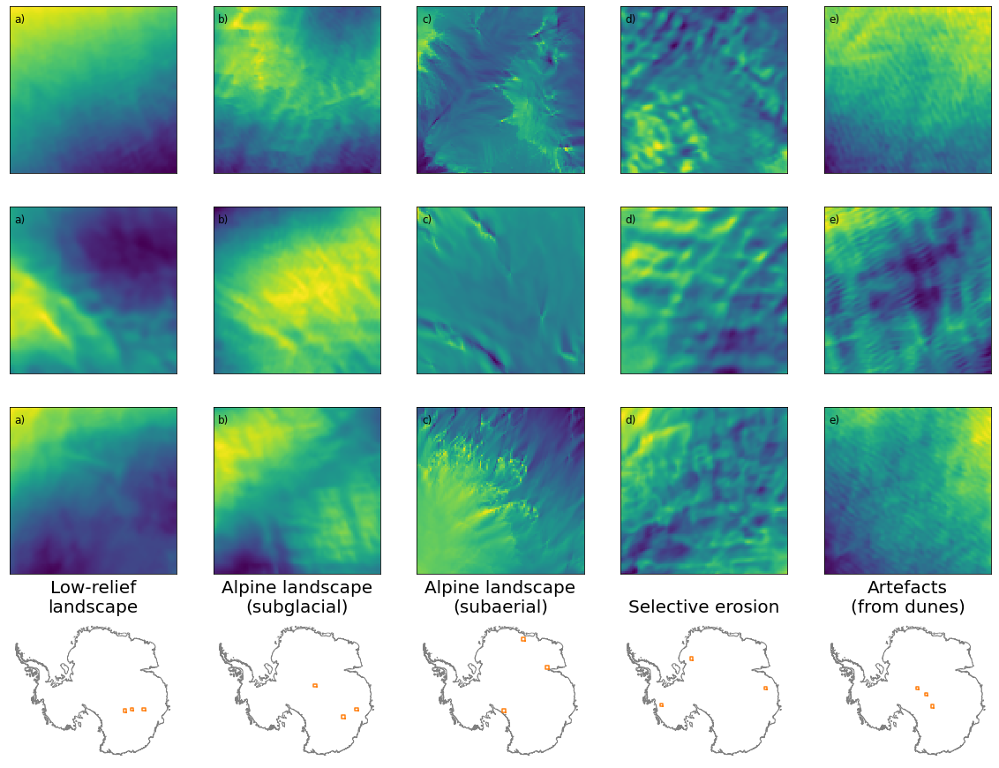

In [24]:
# Plot the example data regions 
fig, ax = plt.subplots(4,5, figsize = (20,16))
d = 10
d2 = 2
im = [[],[],[]]
jj = -1
for kk in (4,2,0,3,1):
    jj = jj +1
    # Create outline boxes for the chosen regions 
    geom1 = box(bounds_array_v1[kk][0], bounds_array_v1[kk][2], bounds_array_v1[kk][1], bounds_array_v1[kk][3])
    geom2 = box(bounds_array_v2[kk][0], bounds_array_v2[kk][2], bounds_array_v2[kk][1], bounds_array_v2[kk][3])
    geom3 = box(bounds_array_v3[kk][0], bounds_array_v3[kk][2], bounds_array_v3[kk][1], bounds_array_v3[kk][3])
    # Plot the chosen topographies
    im[0] = ax[0,jj].pcolor(X_ifpa_bs1[kk][::d,::d], Y_ifpa_bs1[kk][::d,::d], \
                            bed_ifpa_bs1[kk][::d,::d], cmap = 'viridis')
    im[1] = ax[1,jj].pcolor(X_ifpa_bs2[kk][::d,::d], Y_ifpa_bs2[kk][::d,::d], \
                            bed_ifpa_bs2[kk][::d,::d], cmap = 'viridis')    
    im[2] = ax[2,jj].pcolor(X_ifpa_bs3[kk][::d,::d], Y_ifpa_bs3[kk][::d,::d], \
                            bed_ifpa_bs3[kk][::d,::d], cmap = 'viridis')
    # Plot the outline boxes 
    ax[3,jj].plot(*geom3.exterior.xy, color = 'C1')
    ax[3,jj].plot(*geom2.exterior.xy, color = 'C1')
    ax[3,jj].plot(*geom1.exterior.xy, color = 'C1')
    # Add titles and panel labels
    titles = ('Bedmachine Antarctica', 'Ice Flow Perturbation Analysis')
    labels = ('a)', 'b)', 'c)', 'd)', 'e)' )
    for i in range(3):
        ax[i,jj].annotate(labels[jj], \
               xy=(2, 1), xytext=(0.06, 0.9), xycoords = 'axes fraction', fontsize = 12, ha = 'center');
    # Normalise with the Antarctic grounding line
    for i in range(4):
        groundinglineM.plot(ax = ax[i,jj], facecolor = 'None', edgecolor='grey')
        ax[i,jj].get_xaxis().set_ticks([]); ax[i,jj].get_yaxis().set_ticks([]);   
    # Set the x and y limits in the plot 
    ax[0,jj].set_xlim(bounds_array_v1[kk][0], bounds_array_v1[kk][1])
    ax[1,jj].set_xlim(bounds_array_v2[kk][0], bounds_array_v2[kk][1])
    ax[2,jj].set_xlim(bounds_array_v3[kk][0], bounds_array_v3[kk][1])
    ax[0,jj].set_ylim(bounds_array_v1[kk][2], bounds_array_v1[kk][3])
    ax[1,jj].set_ylim(bounds_array_v2[kk][2], bounds_array_v2[kk][3])
    ax[2,jj].set_ylim(bounds_array_v3[kk][2], bounds_array_v3[kk][3])
    ax[3,jj].axis('off');
    ax[3,jj].annotate(types[kk], \
               xy=(2, 1), xytext=(0.5, 1.05), xycoords = 'axes fraction', fontsize = 20, ha = 'center');
# Save figure to file
fig.savefig(figures_folder + '08_Textural_examples.png', dpi = 200, bbox_inches = 'tight')

### Figure 9 

**Textural and spectral characteristics of different topographic styles.** Eleven textural
and spectral characteristics plotted for the training data set for five classes of subglacial topography
(Areal scour in yellow, Alpine (subglacial) in orange, Alpine (aerial) in black, Selective linear erosion
(SLE) in ice streams in dark blue and artefacts from dunes in light blue). Note that the axis scales
for panel c) have been chosen to show the variability between regions of areal scour and regions with
artefacts from dunes, and so most data points for alpine (aerial) fall outside of the chosen region.

In [25]:
# Create a function to filter data based on set boundaries 
def extract_area_params(variable_names, bounds):
    mask_x = (x_ifpa > (bounds[0]-10)) & (x_ifpa < (bounds[1])+10)
    mask_y = (y_ifpa > (bounds[2]-10)) & (y_ifpa < (bounds[3])+10)
    mask_xy = mask_x & mask_y
    vs = np.ndarray(len(variable_names), dtype = np.ndarray)
    params = np.ndarray((len(variable_names),2), dtype = np.ndarray)
    for i in range(len(variable_names)):
        vs[i] = extract_from_matrix(variable_names[i])
        params[i,0] = vs[i][mask_xy]
        params[i,1] = variables_labels[i][1]
    return params

In [26]:
# List variables to import and also a longform name for plotting 
variables_labels =  [['ifpa_mean', 'Mean'], \
                     ['ifpa_b1_thickness', 'Fourier fractal dimension\n(> ice thickness)'], \
                     ['ifpa_rms_curvature', 'RMS curvature'], \
                     ['ifpa_rms_slope', 'RMS slope'], \
                     ['ifpa_wav_max_power', 'Wavelength of maximum power'], \
                     ['ifpa_count_max_20', 'Number of 20m hills in 5km'],\
                     ['ifpa_count_max_100', 'Number of 100m hills in 5km'],\
                     ['ifpa_count_max_250', 'Number of 250m hills in 5km'],\
                     ['ifpa_std_deslope', 'Standard deviation\nwith slope removed'], \
                     ['i_std_l', 'Low frequency\nstandard deviation'], \
                     ['i_rms_slope_h', 'High frequency\nRMS slope']]

In [27]:
# Import the variables for each of the chosen regions 
variable_names = []
for i in range(len(variables_labels)):
    variable_names.append(variables_labels[i][0])
params_all1 = np.ndarray(len(bounds_array_v1), dtype = np.ndarray)
params_all2 = np.ndarray(len(bounds_array_v2), dtype = np.ndarray)
params_all3 = np.ndarray(len(bounds_array_v3), dtype = np.ndarray)
for i in range(len(bounds_array_v1)):
    params_all1[i] = extract_area_params(variable_names, bounds_array_v1[i])
    params_all2[i] = extract_area_params(variable_names, bounds_array_v2[i])
    params_all3[i] = extract_area_params(variable_names, bounds_array_v3[i])

In [28]:
# Create a function to plot a scatter plot of chosen variables x and y 
def plotting(x,y, ax, label = 'a)', leg = 'False'):
    color_map = plt.cm.get_cmap(plt.cm.rainbow)
    color_map2 =plt.cm.get_cmap(plt.cm.Greys)
    s_color = ('#f3e738','#2f64b4','#ff9248','#e75921','C9')
    s_color = ('k', 'C9','#ff9248','#2f64b4','#f3e738')
    for i in (4, 2, 0, 3, 1):
        x_array = params_all1[i][params_all1[0][:,1] == x][0][0]
        y_array = params_all1[i][params_all1[0][:,1] == y][0][0]
        if y == 'Fourier fractal dimension\n(> ice thickness)':
            ax.scatter(x_array,  3 + y_array/2, c = s_color[i], label = types[i])
        else:
            ax.scatter(x_array, y_array, c = s_color[i], label = types[i])
        x_array = params_all2[i][params_all2[0][:,1] == x][0][0]
        y_array = params_all2[i][params_all2[0][:,1] == y][0][0]
        if y == 'Fourier fractal dimension\n(> ice thickness)':
            ax.scatter(x_array,  3 + y_array/2, c = s_color[i])
        else:
            ax.scatter(x_array, y_array, c = s_color[i])
        x_array = params_all3[i][params_all3[0][:,1] == x][0][0]
        y_array = params_all3[i][params_all3[0][:,1] == y][0][0]
        if y == 'Fourier fractal dimension\n(> ice thickness)':
            ax.scatter(x_array,  3 + y_array/2, c = s_color[i])
        else:
            ax.scatter(x_array, y_array, c = s_color[i])
 
    ax.set_xlabel(params_all1[i][params_all1[0][:,1] == x][0][1], fontsize = 20)
    ax.set_ylabel(params_all1[i][params_all1[0][:,1] == y][0][1], fontsize = 20) 
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    if leg == True:
        ax.legend(loc = (-0.95,-0.4), fontsize = (24), markerscale = 4, ncol=5)
    ax.annotate(label, \
               xy=(2, 1), xytext=(0.05, 0.9), xycoords = 'axes fraction', fontsize = 20, ha = 'center');

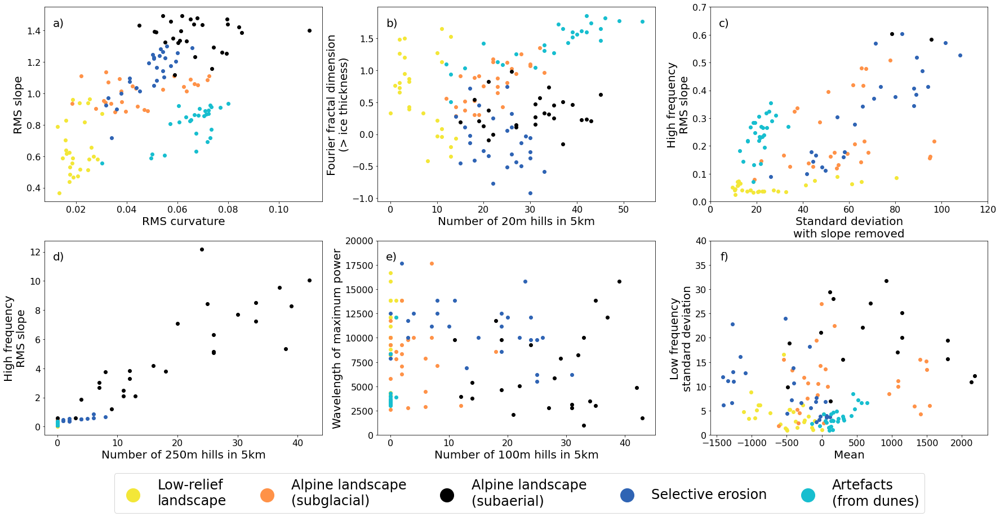

In [29]:
# Plot scatter plots for the chosen important variables 
fig, ax = plt.subplots(2,3, figsize = (30,14))
plotting('RMS curvature', 'RMS slope', ax = ax[0,0])
plotting('Number of 20m hills in 5km', 'Fourier fractal dimension\n(> ice thickness)', ax = ax[0,1], label = 'b)')
plotting('Standard deviation\nwith slope removed', 'High frequency\nRMS slope', ax  = ax[0,2], label = 'c)')
ax[0,2].set_xlim(0,120)
ax[0,2].set_ylim(0,0.7)
plotting('Number of 250m hills in 5km', 'High frequency\nRMS slope', ax = ax[1,0], label = 'd)')
plotting('Number of 100m hills in 5km', 'Wavelength of maximum power', ax = ax[1,1],  leg = True, label = 'e)')
ax[1,1].set_ylim(0,20000)
plotting('Mean', 'Low frequency\nstandard deviation', ax = ax[1,2], label = 'f)')
ax[1,2].set_ylim(0,40)
# Save figure to file 
fig.savefig(figures_folder + '09_Textural_sorting.png', dpi = 200, bbox_inches = 'tight')

### Figure A1 

**The new IFPA Antarctic subglacial topography map with Bedmachine Antarctica and Bedmap3 coverage for comparison.** (a) All-Antarctica IFPA subglacial topography;
(b) All-Antarctica BedMachine topography [22]; (c) BedMachine flight-track coverage (Adapted from
[22]), (e) the mean difference to the nearest Bedmap3 ice-thickness data point [20] for 50 km by
50km regions, and (d) the region where the mean distance to the nearest ice-thickness measurement
is more than 4km, and where we would expect IFPA to make the largest improvements to subglacial
topography.

Panels a and b can be plotted using the script Figure_A1abc.py. Panel c in the manuscript is adapted from Figure 2 of the Bedmachine v3 User Guide, DOI: 10.5067/FPSU0V1MWUB6. 

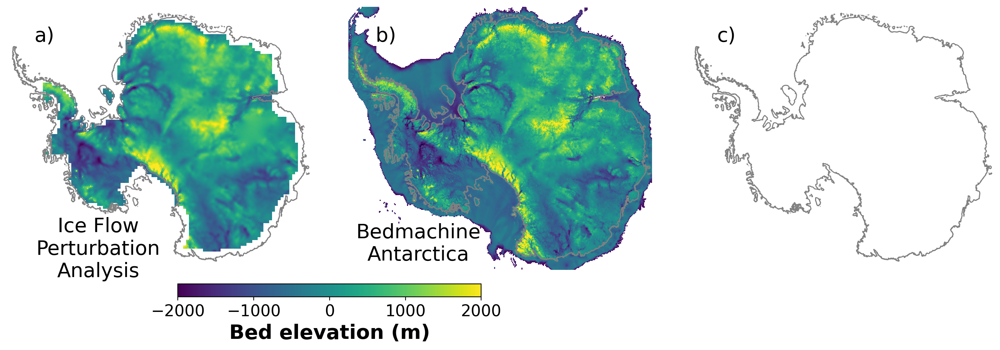

In [30]:
source_ifpa = extract_from_matrix('source')
mean_nearest = extract_from_matrix('mean_nearest') 
bedmap3_count = extract_from_matrix('bedmap3_count')

In [31]:
count_mask = (source_ifpa == 5)
values, bins = np.histogram(bedmap3_count[count_mask], \
                            bins=(0,100,250, 500,1250,2500,3750,\
                                  5000,6250,7500, 8750,10000,10250,12500,15000, 20000,25000,32500,50000,62500,75000, 87500,100000))
cumulative = np.cumsum(np.flip(values))/(np.sum(len(x_ifpa)))

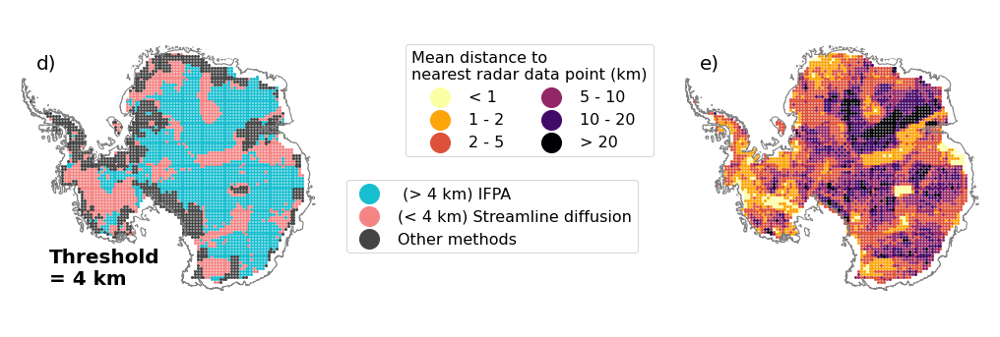

In [32]:
# Set up the figure axes
ax = [[],[],[],[],[],[]]
fig = plt.figure(constrained_layout=True, figsize = (14,5))
widths = [2,2,2,2,2,2]
heights = [2,2,0.2]
gs = fig.add_gridspec(3,6, width_ratios = widths, height_ratios = heights)
ax[0] = fig.add_subplot(gs[0:2,0:2])
ax[1] = fig.add_subplot(gs[0,2:4])
ax[2] = fig.add_subplot(gs[0:2,4:6])
ax[3] = fig.add_subplot(gs[1, 1:3])
ax[4] = fig.add_subplot(gs[1, 3:5])
ax[5] = fig.add_subplot(gs[1,2:4])
# Plot the data
alphas = [1,1,1,1,1,0]
for i in (0,5):
        threshold = 4000
        ax[i].scatter(x_ifpa[count_mask & (mean_nearest > threshold)], y_ifpa[count_mask & (mean_nearest > threshold)], \
                    color = 'C9', label = ' (> 4 km) IFPA'.format(threshold/1000), s = 4, alpha = alphas[i])
        ax[i].scatter(x_ifpa[count_mask & (mean_nearest < threshold)], y_ifpa[count_mask & (mean_nearest < threshold)], \
                    color = '#f58484', label = '(< 4 km) Streamline diffusion'.format(threshold/1000), \
                      s = 4, alpha = alphas[i])
        ax[i].scatter(x_ifpa[~count_mask], y_ifpa[~count_mask], color = '#444444', label = 'Other methods', \
                      s = 4, alpha = alphas[i])
        if i == 5:
            leg = ax[i].legend(loc = 'upper left', fontsize = 16, frameon=True,markerscale=10,ncol=1)
            for lh in leg.legendHandles:
                lh.set_alpha(1)
        ax[i].axis('off')
        if i == 0:
            ax[i].annotate('Threshold\n= {:.0f} km'.format(threshold/1000), \
                   xy=(2, 1), xytext=(0.13, 0.07), xycoords = 'axes fraction', fontsize = 20, fontweight = 'bold');
# Set and plot axis labels and extents 
mid_letters = ['d)','e)','e)']
for i in (0,2):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='grey', zorder = 2)
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);
    ax[i].axis('off')
    ax[i].annotate(mid_letters[i], \
               xy=(2, 1), xytext=(0.09, 0.87), xycoords = 'axes fraction', fontsize = 20);
# Plot the bedmap3 count data 
levels = (1, 2,5, 10, 20)
fraction = (0.1, 0.25, 0.4, 0.6, 0.75, 0.9)
fraction = (0,0.2,0.4,0.6,0.8,1.0)
mask = np.ndarray(len(levels)+1, dtype = np.ndarray)
for i in range(len(mask)):
    if i == 0:
        mask[i] = mean_nearest/1000 < levels[0]
    elif i == (len(mask) -1):
        mask[i] = mean_nearest/1000 > levels[-1]
    else:
        mask[i] = (mean_nearest/1000 > levels[i-1]) & (mean_nearest/1000 < levels[i])
# Plot the real points on axis 2
color_map =plt.cm.get_cmap(plt.cm.inferno_r)
for i in range(len(mask)):
    if i == 0:
        ax[2].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                      label = '< {}'.format(levels[0]), s = 4)
    elif i == len(levels):
        ax[2].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '> {}'.format((int(levels[i-1]))), s = 4)
    else:
        ax[2].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '{} - {}'.format(levels[i-1],levels[i]), s = 4)
# Plot dummy points on axis 1 to get the legend in the right place
color_map =plt.cm.get_cmap(plt.cm.inferno_r)
for i in range(len(mask)):
    if i == 0:
        ax[1].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                      label = '< {}'.format(levels[0]), s = 4, alpha = 0)
    elif i == len(levels):
        ax[1].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '> {}'.format((int(levels[i-1]))), s = 4, alpha = 0)
    else:
        ax[1].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '{} - {}'.format(levels[i-1],levels[i]), s = 4, alpha = 0)
# Plot the legend
leg = ax[1].legend(title = 'Mean distance to\nnearest radar data point (km)', fontsize = 16, title_fontsize = 16, \
          loc = 'lower right', markerscale = 10, ncol=2)
for lh in leg.legendHandles:
    lh.set_alpha(1)
ax[1].axis('off')
# Remove axis underneath legends
ax[3].axis('off')
ax[4].axis('off')
# Save figure to file
fig.savefig(figures_folder + 'A1_de_Bedmap3_threshold.png', dpi = 200, bbox_inches = 'tight')

### Figure A2 

Mean elevation, Standard deviation with the slope removed, low frequency standard devi-
ation, RMS slope, High frequency RMS slope and RMS curvature for 50 km by 50 km patches of bed
topography from Ice Flow Perturbation Analysis (a), b), c), g), h) and i) respectively), and Bedma-
chine Antarctica (d), e), f), j), k) and l) respectively).

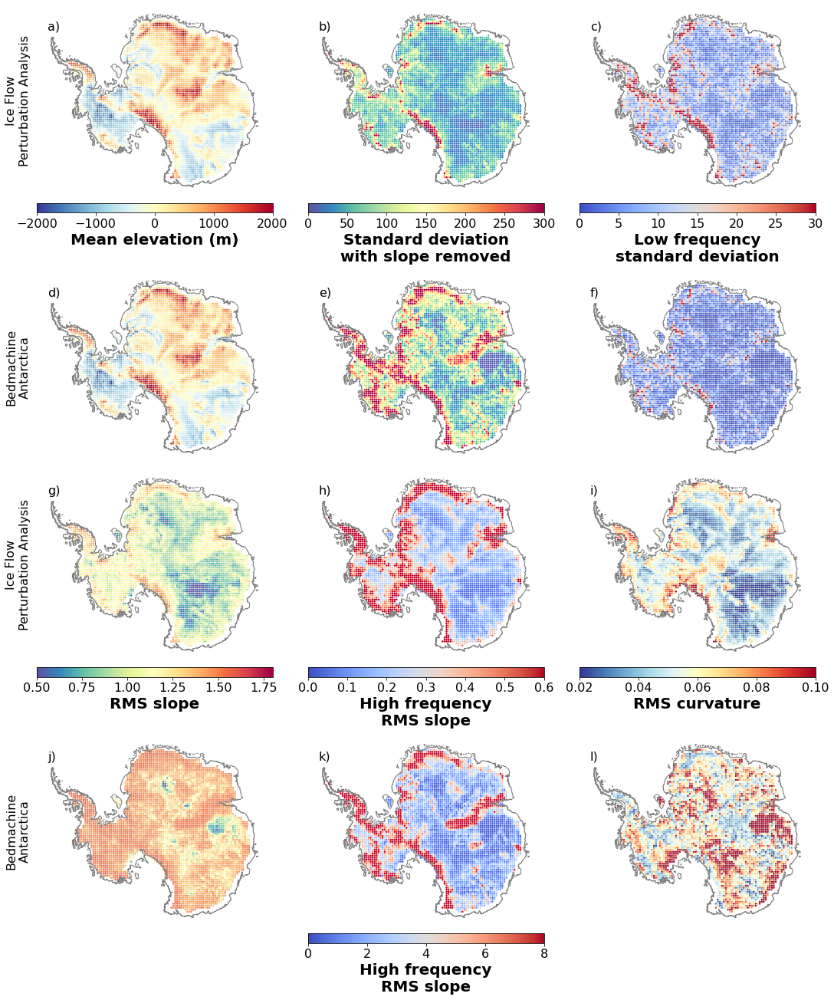

In [33]:
# Create the grid specification
ax = [[[],[],[]],[[],[],[]],[[],[],[]]]
fig = plt.figure(constrained_layout=True, figsize = (15,18))
heights = [4,0.2,4, 4,0.2,4, 0.2]
gs = fig.add_gridspec(7,3, height_ratios = heights)
for i,j in itertools.product(range(3),range(3)):
    ax[j][i] = fig.add_subplot(gs[j, i])
ax2 = [[[],[],[]],[[],[],[]],[[],[],[]],[[],[],[]]]
for i,j in itertools.product(range(3),range(4)):
    ax2[j][i] = fig.add_subplot(gs[j+3, i])
# Load in the data for the plots and set individual parameters     
plots = [[extract_from_matrix('mean_ifpa'), extract_from_matrix('ifpa_std_deslope'), extract_from_matrix('i_std_l')],\
         [extract_from_matrix('bedmach_mean'), extract_from_matrix('bedmach_std_deslope'),extract_from_matrix('b_std_l')]]
cmaps = ['RdYlBu_r', 'Spectral_r', 'coolwarm']
clims = [[-2000,2000],[0,300],[0,30]]
labels = ['Mean elevation (m)', 'Standard deviation\nwith slope removed', 'Low frequency\nstandard deviation']
letters = [['a)','b)','c)'],['d)','e)','f)']]
# Plot the data 
for i,j in itertools.product(range(3),range(2)):
    im = ax[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax[j*2][i], facecolor = 'None', edgecolor='grey')
    ax[j*2][i].get_xaxis().set_ticks([]); ax[j*2][i].get_yaxis().set_ticks([]);
    ax[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
# Load in the data for the plots in row 2 and set individual parameters
plots = [[extract_from_matrix('ifpa_rms_slope'), extract_from_matrix('i_rms_slope_h'), \
          extract_from_matrix('ifpa_rms_curvature')],\
         [extract_from_matrix('bedmach_rms_slope'), extract_from_matrix('b_rms_slope_h'), \
          extract_from_matrix('bedmach_rms_curvature')]]
cmaps = ['Spectral_r', 'coolwarm', 'RdYlBu_r']
clims = [[0.5,1.8],[0,0.6],[0.02,0.1]]
clims2 = [[0.5,1.8],[0,8],[0.02,0.1]]
labels = ['RMS slope', 'High frequency\nRMS slope', 'RMS curvature']
letters = [['g)','h)','i)'],['j)','k)','l)']]    
# Plot the data    
for i,j in itertools.product(range(3),range(2)):
    im = ax2[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    groundinglineM.plot(ax = ax2[j*2][i], facecolor = 'None', edgecolor='grey')
    ax2[j*2][i].get_xaxis().set_ticks([]); ax2[j*2][i].get_yaxis().set_ticks([]);
    ax2[j*2][i].axis('off')
    if j == 1:
        if i in (0,2):
            ax2[1+2*j][i].axis('off')
        else:
            cb = plt.colorbar(im, cax = ax2[1 + 2*j][i], orientation = 'horizontal')
            cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
            cb.ax.tick_params(labelsize=16)
    else:
        cb = plt.colorbar(im, cax = ax2[1 + 2*j][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    if j == 0:
        im.set_clim(clims[i])
    else: 
        im.set_clim(clims2[i])
    ax2[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax2[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax2[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')   
# Save figure to file
fig.savefig(figures_folder + 'A2_Metrics_extended.png', dpi = 200, bbox_inches = 'tight')

### Figure A3 

Fourier fractal dimension for wavelengths greater than the ice thickness, and for wavelengths
greater than 5 km, the highest power wavelength of the Fourier transformed data, the number of
20m hills in 5km, number of 100m hills in 5km and number of 200m hills in 5km for 50 km by 50 km
patches of bed topography from Ice Flow Perturbation Analysis (a), b), c), g), h) and i) respectively),
and Bedmachine Antarctica (d), e), f), j), k) and l) respectively).

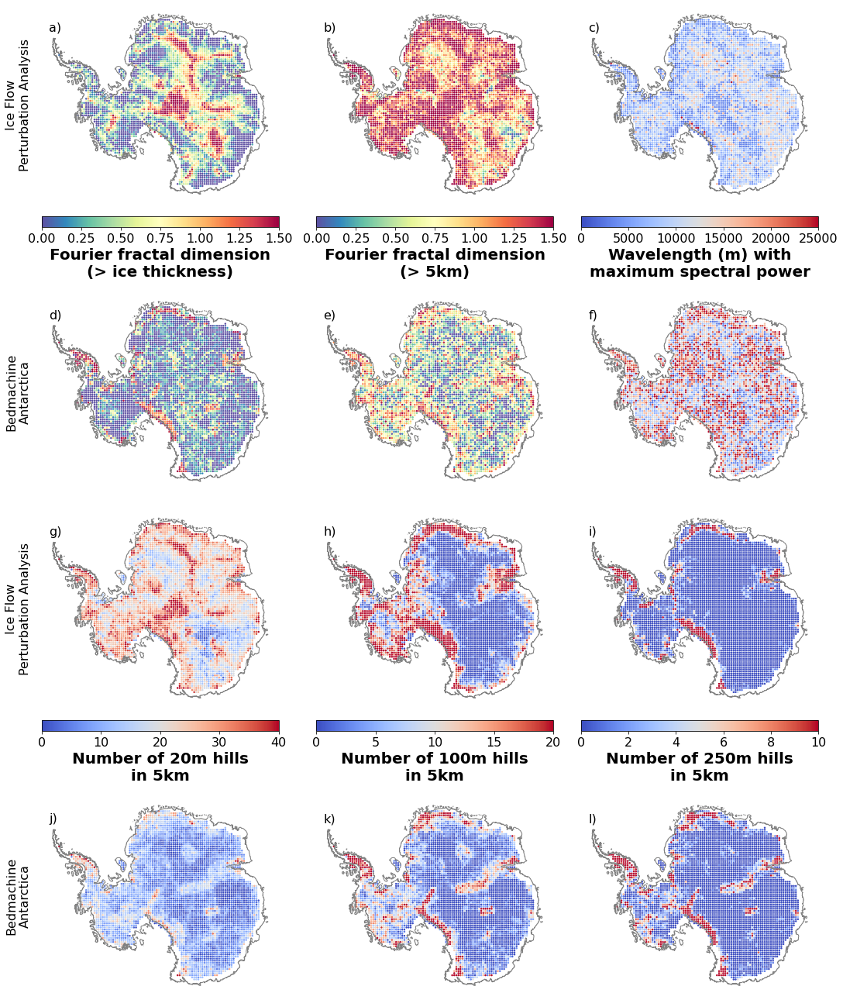

In [34]:
# Load in the data for the first set of plots
plots = [[3+extract_from_matrix('ifpa_b1_thickness')/2, 3+extract_from_matrix('ifpa_b1_5km')/2, \
          extract_from_matrix('ifpa_wav_max_power')],\
         [3+extract_from_matrix('bedmach_b1_thickness')/2, 3+extract_from_matrix('bedmach_b1_5km')/2, \
          extract_from_matrix('bedmach_wav_max_power')]]
cmaps = ['Spectral_r', 'Spectral_r', 'coolwarm']
clims = [[0,1.5],[0,1.5],[0,25000]]
labels = ['Fourier fractal dimension\n(> ice thickness)', 'Fourier fractal dimension\n(> 5km)', 'Wavelength (m) with\nmaximum spectral power']
letters = [['a)','b)','c)'],['d)','e)','f)']]
# Set grid parameters
ax2 = [[[],[],[]],[[],[],[]],[[],[],[]]]
fig = plt.figure(constrained_layout=True, figsize = (15,18))
heights = [4,0.2,4, 4,0.2,4]
gs = fig.add_gridspec(6,3, height_ratios = heights)
for i,j in itertools.product(range(3),range(3)):
    ax2[j][i] = fig.add_subplot(gs[j, i])    
ax = [[[],[],[]],[[],[],[]],[[],[],[]]]
for i,j in itertools.product(range(3),range(3)):
    ax[j][i] = fig.add_subplot(gs[j+3, i])
# Plot first 2 rows of plots    
for i,j in itertools.product(range(3),range(2)):
    im = ax2[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax2[j*2][i], facecolor = 'None', edgecolor='grey')
    ax2[j*2][i].get_xaxis().set_ticks([]); ax2[j*2][i].get_yaxis().set_ticks([]);
    ax2[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax2[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax2[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax2[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax2[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
# Set data and individual parameters for rows 3 and 4 of plots 
plots = [[extract_from_matrix('ifpa_count_max_20'), extract_from_matrix('ifpa_count_max_100'), \
          extract_from_matrix('ifpa_count_max_250')],\
         [extract_from_matrix('bedmach_count_max_20'), extract_from_matrix('bedmach_count_max_100'), \
          extract_from_matrix('bedmach_count_max_250')]]
cmaps = ['coolwarm', 'coolwarm', 'coolwarm']
#cmaps = ['YlOrRd', 'YlOrRd', 'YlOrRd']
clims = [[0,40],[0,20],[0,10]]
labels = ['Number of 20m hills\nin 5km', 'Number of 100m hills\nin 5km', 'Number of 250m hills\nin 5km']
letters = [['g)','h)','i)'],['j)','k)','l)']]
# Plot data 
for i,j in itertools.product(range(3),range(2)):
    im = ax[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax[j*2][i], facecolor = 'None', edgecolor='grey')
    ax[j*2][i].get_xaxis().set_ticks([]); ax[j*2][i].get_yaxis().set_ticks([]);
    ax[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction');
# Save figure to file    
fig.savefig(figures_folder + 'A3_Metrics_extended.png', dpi = 200, bbox_inches = 'tight')

### Figure A4 onwards

We present in the main body of the text a selection of bed topography patches with
features of interest. For completeness, we include a larger selection of figures here,
covering the interior regions of the entire Antarctic continent. These figures cover
larger areas than those presented in the main body of the text, and so occasionally
some of the detail is obscured by the colour scale, but they give a more comprehensive
overview of the features detected by Ice Flow Perturbation Analysis.

These figures can be plotted by running the script: Map_plots.py